# (보충판) train_final_example + USRNet method C

**공식 배포본(`train_final_example.ipynb`)의 셀은 전부 무수정 유지**하고, 두 가지만 얹었다:

1. **보충 셀** — 배포본에 빠져 있는 설정/데이터로더/`train_model` 정의 (Day1 의
   `NoiseSimulator` 누락과 같은 전례. 보충 셀에는 제목에 `[보충]` 을 달았다)
2. **method C — USRNet** (공식 cszn 코드 무수정 + 공식 pretrained fine-tune, 팀원 Day2 검증 레시피)

**실행 가이드**: 위에서부터 순서대로 전부 실행하면 된다 (학습은 USRNet 만 돈다).
A/B 학습 셀은 제거했다 — A 는 조교 체크포인트가 오면 test 평가 셀의 TA_UNET_CKPT 에 경로만
지정하면 표에 포함되고, B(DnCNN)는 팀 내 다른 트랙 담당이다. SPECS 에 A/B 정의는 남아 있어
필요해지면 RESULTS[이름] = train_model(SPECS[이름]) 한 줄로 언제든 학습할 수 있다.

**sigma 설계** (noise_meta.json 은 "결과 분석 전용" 지시라 모델 입력으로 쓸 수 없다):
- 학습: 시뮬레이터가 방금 만든 노이즈의 잔차 std 를 정확히 계산 (+ 지터로 추정 오차에 강건화)
- 검증/test: **cone 추정기** — dipole 이 0 이 되는 magic angle 자리에서는 신호가 사라지고
  노이즈만 남는 물리를 이용한 blind 추정. val 에서 (참값, 추정값) 쌍으로 1차 보정.


# Dipole deconvolution + denoising restoration

0. 조교가 만든 A. end to end UNet network의 체크포인트를 제공해 드리오니, 필요 시 활용하셔도 됩니다.

1. dataset 폴더의 **test_deconv_noise** 데이터를 모델의 input으로 넣어서, **test_label(정답)** 데이터를 이용해 metric을 측정해 주세요.
test_deconv_noise dataset은 dipole conv --> noise 순서로 만들어 졌습니다.

2. metric을 측정을 위해 이전에 제공한 **psnr, ssim** 코드를 사용해 주세요.

**결과 분석 & 좋은 점수를 위한 tips...**
- test_deconv_noise/noise_meta.json 에서 각각의 이미지가 어떤 노이즈에 해당하는지 확인하실 수 있습니다. 결과 분석에만 사용해 주세요.

- train을 위해서 사용한 synthetic image, 결과 test 이미지는 꼭 visaulize 해 보세요. difference map, detail한 부분은 zoom-in을 해 주세요.

- 구축한 프레임워크가 어떤 노이즈에 취약한지, 어떤 type의 이미지에 취약한지 분석해 보세요.

- Day1, Day2 때 했던 conventional methods 들과 결과를 비교해 보세요.

- 적은 수의 데이터로 학습하기 or self supervised learning 방식을 활용해 보세요.

## 0. [보충] 설정 · 데이터 준비

공식 배포본이 참조하지만 정의가 없는 것들: `VOXEL_SIZE`, `B0_DIR`, `NOISE_RANGES`,
`config`, import 일체. Colab 이면 Drive 마운트 + 로컬 디스크 복사(Day2 방식)까지 한다.


In [1]:
import glob
import json
import os
import random
import time
import warnings
import zlib
from dataclasses import dataclass, field
from enum import Enum, IntEnum
from functools import lru_cache
from pathlib import Path
from typing import Callable

import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import Tensor, nn
from torch.nn import functional
from torch.utils.data import DataLoader, Dataset
from tqdm.auto import tqdm

warnings.filterwarnings("ignore")

# ---- 프로젝트 루트: Colab(Drive) 우선, 아니면 현재 폴더에서 위로 탐색 ----
ROOT = Path("/content/drive/MyDrive/플젝5")
if not ROOT.exists():
    try:
        from google.colab import drive  # Colab 인데 마운트가 안 된 경우

        drive.mount("/content/drive")
    except ImportError:
        ROOT = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "dataset").exists())
print(f"ROOT = {ROOT}")

# ---- Colab 이면 데이터셋을 VM 로컬 디스크로 복사 (Drive 직접 읽기는 I/O 병목) ----
# 이 노트북이 실제로 쓰는 폴더만 압축에서 선택적으로 푼다 (전체 unzip 은 test_* 폴더들까지 풀어 느리다).
# 학습 없이 평가만 할 때는 NEEDED_SPLITS 에서 "train" 을 빼면 수 초에 끝난다
# (단, 그 경우 공식 "2-1 Train synthetic pair 확인" 셀은 건너뛸 것).
NEEDED_SPLITS = ["train", "val", "test_label"]

if Path("/content").exists():
    import shutil
    import zipfile

    LOCAL_DATA = Path("/content/dataset")
    LOCAL_DATA.mkdir(parents=True, exist_ok=True)
    _zip = ROOT / "dataset.zip"
    _missing = [s for s in NEEDED_SPLITS if not (LOCAL_DATA / s).exists()]
    if _missing and _zip.exists():
        _t0 = time.time()
        with zipfile.ZipFile(_zip) as _zf:
            for _mname in _zf.namelist():
                if _mname.endswith("/"):
                    continue
                _parts = Path(_mname).parts
                if _parts and _parts[0] == "dataset":
                    _parts = _parts[1:]
                if not _parts or _parts[0] not in _missing:
                    continue
                _dest = LOCAL_DATA.joinpath(*_parts)
                _dest.parent.mkdir(parents=True, exist_ok=True)
                with _zf.open(_mname) as _srcf, open(_dest, "wb") as _outf:
                    shutil.copyfileobj(_srcf, _outf)
        print(f"unzip {_missing}: {time.time() - _t0:.1f}s")
    # zip 에 없는 폴더는 Drive 에서 복사 (이미 있으면 건너뜀)
    for _s in NEEDED_SPLITS:
        if not (LOCAL_DATA / _s).exists() and (ROOT / "dataset" / _s).exists():
            shutil.copytree(ROOT / "dataset" / _s, LOCAL_DATA / _s)
            print(f"sync {_s}")
    _d3 = ROOT / "test_deconv_noise" / "test_deconv_noise"
    if _d3.exists() and not (LOCAL_DATA / "test_deconv_noise").exists():
        shutil.copytree(_d3, LOCAL_DATA / "test_deconv_noise")
        print("sync test_deconv_noise")
    DATA_ROOT = LOCAL_DATA
else:
    DATA_ROOT = ROOT / "dataset"

# test measure 폴더 위치 (dataset/ 안 또는 프로젝트 루트의 배포 폴더)
TEST_MEASURE_DIR = DATA_ROOT / "test_deconv_noise"
if not TEST_MEASURE_DIR.exists():
    TEST_MEASURE_DIR = ROOT / "test_deconv_noise" / "test_deconv_noise"
print(f"DATA_ROOT = {DATA_ROOT}")
print(f"TEST_MEASURE_DIR = {TEST_MEASURE_DIR}")

# ---- 공식 셀들이 참조하는 상수 ----
VOXEL_SIZE: tuple[float, float] = (1.0, 1.0)
B0_DIR: tuple[float, float] = (0.0, 1.0)

NOISE_RANGES: dict[str, tuple[float, float]] = {
    "gaussian": (0.0, 0.1),
    "rician": (0.0, 0.15),
    "uniform": (0.0, 0.2),
    "salt_and_pepper": (0.0, 0.2),
}


@dataclass
class Config:
    train_split: str = "train"
    valid_split: str = "val"
    test_label_split: str = "test_label"

    valid_batch: int = 4
    num_workers: int = 2  # Colab 공유메모리(/dev/shm) 고갈 방지. 데이터 생성이 가벼워 2로 충분
    clip_output: bool = True  # finalize(): label 이 [0,1] 이므로 출력을 clip

    run_dir: Path = None  # 아래에서 설정
    usrnet_dir: Path = None
    device: torch.device = None


config = Config()
config.run_dir = ROOT / "logs_final"
config.usrnet_dir = ROOT / "Day3" / "usrnet"  # 공식 cszn 코드 + usrnet.pth
config.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"device = {config.device}")

Mounted at /content/drive
ROOT = /content/drive/MyDrive/플젝5
unzip ['train', 'val', 'test_label']: 33.4s
sync test_deconv_noise
DATA_ROOT = /content/dataset
TEST_MEASURE_DIR = /content/dataset/test_deconv_noise
device = cuda


## 1. Forward model : dipole convolution + noise

$$y = \mathcal{N}\big(\underbrace{\mathcal{F}^{-1}\{D(k)\,\mathcal{F}\{x\}\}}_{\text{dipole convolution}}\big)$$

- `train` / `val` : clean image에 ** dipole + noise** 를 건다.
  - train 은 flip augmentation 후 매번 새 noise
  - val 은 파일 이름 기반 seed 로 noise 를 고정해 epoch 간 비교가 가능하게 한다
- `test` : 제공된 **`test_deconv_noise`**


### 1-1. Dipole kernel

$$D(k) = \frac{1}{3} - \frac{(k \cdot \hat{B_0})^2}{|k|^2}$$

`B0_dir = (0, 1)` -> magic angle (약 54.7도) 원뿔에서 `D = 0` 이라 그 성분은 원리적으로 복원 불가능하다.

In [2]:
@lru_cache(maxsize=16)
def dipole_kernel(
    matrix_size: tuple[int, int],
    voxel_size: tuple[float, float] = VOXEL_SIZE,
    B0_dir: tuple[float, float] = B0_DIR,
) -> torch.Tensor:
    y = np.arange(-matrix_size[1] / 2, matrix_size[1] / 2, 1)
    x = np.arange(-matrix_size[0] / 2, matrix_size[0] / 2, 1)
    Y, X = np.meshgrid(y, x)

    X = X / (matrix_size[0] * voxel_size[0])
    Y = Y / (matrix_size[1] * voxel_size[1])

    D = 1 / 3 - (X * B0_dir[0] + Y * B0_dir[1]) ** 2 / (X**2 + Y**2 + 1e-8)
    D = np.fft.fftshift(D)
    return torch.tensor(D, dtype=torch.float32)


def dipole_forward(img: Tensor) -> Tensor:
    kernel = dipole_kernel(tuple(img.shape[-2:])).to(img.device)
    img_k = torch.fft.fftn(img, dim=(-2, -1))
    return torch.fft.ifftn(img_k * kernel, dim=(-2, -1)).real


dipole_adjoint = dipole_forward  # A^T = A (D 가 real, even)

_D = dipole_kernel((256, 256))
print(f"D range [{_D.min():.4f}, {_D.max():.4f}] | |D| < 0.01 인 비율 {float((_D.abs() < 0.01).float().mean()) * 100:.2f}%")

D range [-0.6667, 0.3333] | |D| < 0.01 인 비율 1.59%


### 1-2. Noise 4종 (Gaussian, Rician, Uniform, Salt and Pepper)

    "gaussian": (0.0, 0.1),
    "rician": (0.0, 0.15),
    "uniform": (0.0, 0.2),
    "salt_and_pepper": (0.0, 0.2)

In [3]:
class NoisyType(str, Enum):
    Gaussian = "gaussian"
    Rician = "rician"
    Uniform = "uniform"
    SaltAndPepper = "salt_and_pepper"

    @classmethod
    def from_string(cls, value: str) -> "NoisyType":
        try:
            return cls(value)
        except ValueError as err:
            raise ValueError(f"Invalid NoisyType value: {value}. Must be one of {list(cls)} : {err}") from err

Gen = torch.Generator | None


def gaussian_noise(img: Tensor, sigma: float, generator: Gen = None) -> Tensor:
    noise = torch.empty_like(img).normal_(0.0, 1.0, generator=generator) * sigma
    return img + noise


def rician_noise(img: Tensor, sigma: float, generator: Gen = None) -> Tensor:
    noise_real = torch.empty_like(img).normal_(0.0, 1.0, generator=generator) * sigma
    noise_imag = torch.empty_like(img).normal_(0.0, 1.0, generator=generator) * sigma
    return torch.abs(img + noise_real + 1j * noise_imag)


def uniform_noise(img: Tensor, sigma: float, generator: Gen = None) -> Tensor:
    return img + (torch.empty_like(img).uniform_(0.0, 1.0, generator=generator) * 2.0 - 1.0) * sigma


def salt_and_pepper_noise(img: Tensor, sigma: float, generator: Gen = None) -> Tensor:
    salt_prob = sigma / 2
    pepper_prob = sigma / 2
    noisy_img = img.clone()
    total_pixels = img.numel()

    num_salt = int(total_pixels * salt_prob)
    coords = [torch.randint(0, dim, (num_salt,), generator=generator) for dim in img.shape]
    noisy_img[tuple(coords)] = img.max()

    num_pepper = int(total_pixels * pepper_prob)
    coords = [torch.randint(0, dim, (num_pepper,), generator=generator) for dim in img.shape]
    noisy_img[tuple(coords)] = 0

    return noisy_img


NOISE_FUNC: dict[NoisyType, Callable[..., Tensor]] = {
    NoisyType.Gaussian: gaussian_noise,
    NoisyType.Rician: rician_noise,
    NoisyType.Uniform: uniform_noise,
    NoisyType.SaltAndPepper: salt_and_pepper_noise,
}


class NoiseSimulator:
    """noise 종류 하나 + sigma 하나를 고정해서 적용한다."""

    def __init__(self, noisy_type: NoisyType, sigma: float) -> None:
        self.noisy_type = noisy_type
        self.sigma = sigma

    def __call__(self, img: Tensor, generator: Gen = None) -> Tensor:
        return NOISE_FUNC[self.noisy_type](img, self.sigma, generator)


class RandomNoiseSimulator:
    """이미지마다 4종 중 하나를 랜덤으로 골라 NOISE_RANGES 범위에서 sigma 를 뽑는다."""

    def __init__(self, noise_ranges: dict[str, tuple[float, float]] | None = None) -> None:
        self.noise_ranges = dict(noise_ranges) if noise_ranges is not None else dict(NOISE_RANGES)
        self.names = list(self.noise_ranges.keys())

    def _sample(self, rng) -> tuple[str, float]:
        name = rng.choice(self.names)
        low, high = self.noise_ranges[name]
        return name, rng.uniform(low, high)

    def __call__(self, img: Tensor, seed: int | None = None) -> Tensor:
        if seed is None:
            # 학습용: 매번 새로 뽑는다 (같은 이미지도 epoch 마다 다른 노이즈)
            name, sigma = self._sample(random)
            generator = None
        else:
            # 검증용: 이미지마다 항상 같은 노이즈가 나오도록 seed 를 고정한다.
            name, sigma = self._sample(random.Random(seed))
            generator = torch.Generator().manual_seed(int(seed) % (2**63 - 1))
        return NoiseSimulator(NoisyType.from_string(name), sigma)(img, generator)

    def describe(self, seed: int) -> tuple[str, float]:
        return self._sample(random.Random(seed))


class DegradationSimulator:
    """clean image -> (blur, measure, noisy_label).

    - blur        : noise 없는 dipole 결과 A x
    - measure     : 실제 측정 N(A x)          <- dipole + noise
    - noisy_label : N(x)                      <- dipole 없이 noise 만 (DnCNN augmentation 용)
    """

    def __init__(self, noise_ranges: dict[str, tuple[float, float]] | None = None) -> None:
        self.noise = RandomNoiseSimulator(noise_ranges)

    def __call__(self, label: Tensor, seed: int | None = None) -> tuple[Tensor, Tensor, Tensor]:
        blur = dipole_forward(label)
        measure = self.noise(blur, seed=seed)
        # clean branch 는 dipole branch 와 독립적인 noise 를 뽑는다 (seed 는 겹치지 않게 어긋냄)
        noisy_label = self.noise(label, seed=None if seed is None else seed ^ 0x5BF03635)
        return blur, measure, noisy_label

## 2. Metric (PSNR / SSIM)

In [4]:
IMG_DIM: int = 4


class SSIMcal(torch.nn.Module):
    def __init__(self, win_size: int = 11, k1: float = 0.01, k2: float = 0.03):
        super().__init__()
        self.win_size = win_size
        self.k1, self.k2 = k1, k2
        self.register_buffer("w", torch.ones(1, 1, win_size, win_size) / win_size**2)
        np_ = win_size**2
        self.cov_norm = np_ / (np_ - 1)

    def forward(self, img: Tensor, ref: Tensor, data_range: Tensor) -> Tensor:
        data_range = data_range[:, None, None, None]
        C1 = (self.k1 * data_range) ** 2
        C2 = (self.k2 * data_range) ** 2

        w = self.w.to(img.device)
        ux = functional.conv2d(img, w)
        uy = functional.conv2d(ref, w)
        uxx = functional.conv2d(img * img, w)
        uyy = functional.conv2d(ref * ref, w)
        uxy = functional.conv2d(img * ref, w)

        vx = self.cov_norm * (uxx - ux * ux)
        vy = self.cov_norm * (uyy - uy * uy)
        vxy = self.cov_norm * (uxy - ux * uy)

        A1 = 2 * ux * uy + C1
        A2 = 2 * vxy + C2
        B1 = ux**2 + uy**2 + C1
        B2 = vx + vy + C2

        return torch.mean((A1 * A2) / (B1 * B2), dim=[2, 3], keepdim=True)


ssim_cal = SSIMcal()


def calculate_ssim(img: Tensor, ref: Tensor, mask: Tensor | None = None) -> Tensor:
    if not (img.dim() == IMG_DIM and ref.dim() == IMG_DIM):
        raise ValueError("All tensors must be 4D.")

    if mask is None:
        img_mask, ref_mask = img, ref
    else:
        if mask.dim() != IMG_DIM:
            raise ValueError("Mask must be 4D.")
        img_mask, ref_mask = img * mask, ref * mask

    ones = torch.ones(ref.shape[0], device=ref.device)
    return ssim_cal.forward(img_mask, ref_mask, ones)


def calculate_psnr(img: Tensor, ref: Tensor, mask: Tensor | None = None) -> Tensor:
    if not (img.dim() == IMG_DIM and ref.dim() == IMG_DIM):
        raise ValueError("All tensors must be 4D.")

    if mask is not None:
        if mask.dim() != IMG_DIM:
            raise ValueError("Mask must be 4D.")
        img_mask, ref_mask = img * mask, ref * mask
        mse = torch.sum((img_mask - ref_mask) ** 2, dim=(1, 2, 3)) / torch.sum(mask, dim=(1, 2, 3))
    else:
        mse = torch.mean(functional.mse_loss(img, ref, reduction="none"), dim=(1, 2, 3), keepdim=True)

    img_max = torch.amax(ref, dim=(1, 2, 3), keepdim=True)
    return 10 * torch.log10(img_max**2 / (mse + 1e-12))


def finalize(pred: Tensor) -> Tensor:
    """모든 방법에 동일하게 적용하는 후처리. label 이 [0,1] 이므로 clip 한다."""
    return pred.clamp(0.0, 1.0) if config.clip_output else pred


def psnr_ssim_np(img: np.ndarray, ref: np.ndarray) -> tuple[float, float]:
    def _t(arr: np.ndarray) -> Tensor:
        return torch.from_numpy(np.ascontiguousarray(arr)).float()[None, None]

    _img, _ref = _t(img), _t(ref)
    return float(calculate_psnr(_img, _ref).item()), float(calculate_ssim(_img, _ref).mean().item())

## 2-0. [보충] DataWrapper / DataLoader

공식 셀 8 이 쓰는 인터페이스를 역산해 맞췄다: loader 는 5-튜플
`(label, measure, blur, noisy_label, name)` 을 돌려준다 (공식 셀 8 의 `_l, _m, _b, _nl, _n`).

- train: flip augmentation 후 `DegradationSimulator` 로 **매 epoch 새 노이즈** (공식 방침)
- val: 파일명 crc32 seed 로 노이즈 고정 → epoch 간 비교 가능
- test: measure 는 `test_deconv_noise` 파일에서 읽고, blur 는 `dipole_forward(label)` 로 재구성


In [5]:
prob_flip: float = 0.5


class DataKey(IntEnum):
    Label = 0
    Measure = 1
    Blur = 2
    NoisyLabel = 3
    Name = 4


@dataclass
class LoaderConfig:
    batch: int
    num_workers: int
    shuffle: bool
    measure_path: str | Path | None = None  # 미리 만들어 둔 measure 디렉토리 (None 이면 on-the-fly)
    max_images: int | None = None


class DataWrapper(Dataset):
    def __init__(
        self,
        label_dir: Path,
        training_mode: bool,
        measure_path: str | Path | None = None,
        max_images: int | None = None,
    ) -> None:
        super().__init__()
        self.training_mode = training_mode
        self.degrade = DegradationSimulator()
        self.measure_path = Path(measure_path) if measure_path is not None else None

        file_list = sorted(glob.glob(str(Path(label_dir) / "*.npy")))
        if max_images is not None:
            file_list = file_list[:max_images]
        self.file_list = file_list

    @staticmethod
    def _load_from_npy(file_npy: str) -> Tensor:
        img = torch.from_numpy(np.load(file_npy)).float()
        if img.dim() == 2:
            img = img.unsqueeze(0)
        return img

    @staticmethod
    def _augment(label: Tensor) -> Tensor:
        if random.random() > prob_flip:
            label = torch.flip(label, dims=[1])
        if random.random() > prob_flip:
            label = torch.flip(label, dims=[2])
        return label

    def __getitem__(self, idx: int):
        name = Path(self.file_list[idx]).name
        label = self._load_from_npy(self.file_list[idx])

        if self.measure_path is None:
            if self.training_mode:
                label = self._augment(label)
                blur, measure, noisy_label = self.degrade(label)
            else:
                blur, measure, noisy_label = self.degrade(label, seed=zlib.crc32(name.encode()))
        else:
            measure_file = self.measure_path / name
            if not measure_file.exists():
                raise FileNotFoundError(f"Matching measure file not found: {measure_file}")
            measure = self._load_from_npy(str(measure_file))
            blur = dipole_forward(label)  # 분석/시각화용 재구성 (모델 입력 아님)
            noisy_label = torch.zeros_like(label)  # test 에서는 사용하지 않는다

        return label, measure, blur, noisy_label, name

    def __len__(self) -> int:
        return len(self.file_list)


def get_data_wrapper_loader(
    label_split: str,
    training_mode: bool,
    loader_cfg: LoaderConfig,
) -> tuple[DataLoader, DataWrapper, int]:
    dataset = DataWrapper(
        label_dir=DATA_ROOT / label_split,
        training_mode=training_mode,
        measure_path=loader_cfg.measure_path,
        max_images=loader_cfg.max_images,
    )
    if len(dataset) == 0:
        raise FileNotFoundError(f"No data found in {DATA_ROOT / label_split}")

    loader = DataLoader(
        dataset,
        batch_size=loader_cfg.batch,
        num_workers=loader_cfg.num_workers,
        pin_memory=True,
        persistent_workers=False,  # 셀 중단 시 worker 가 좀비로 남는 것을 방지
        shuffle=loader_cfg.shuffle,
    )
    return loader, dataset, len(dataset)


# ---- test loader + (결과 분석 전용) noise meta ----
test_loader, test_dataset, test_len = get_data_wrapper_loader(
    label_split=config.test_label_split,
    training_mode=False,
    loader_cfg=LoaderConfig(
        batch=config.valid_batch, num_workers=config.num_workers, shuffle=False,
        measure_path=TEST_MEASURE_DIR,
    ),
)
print(f"test images: {test_len}")

TEST_NOISE_META: dict[str, dict] = {}
_meta_file = TEST_MEASURE_DIR / "noise_meta.json"
if _meta_file.exists():
    with open(_meta_file, encoding="utf-8") as _f:
        TEST_NOISE_META = {m["file"]: m for m in json.load(_f)}
    print(f"noise_meta.json: {len(TEST_NOISE_META)} entries (공식 지시대로 **결과 분석에만** 사용)")

# 공식 시각화 셀(conventional 대표 sample)이 참조하는 인덱스 - 배포본에 정의 누락
SAMPLE_IDX: int = 0


test images: 100
noise_meta.json: 100 entries (공식 지시대로 **결과 분석에만** 사용)


### 2-1. Train synthetic pair 확인

`train` split 은 매 epoch 새로 noise 를 뽑으므로, 같은 영상이라도 매번 다른 degradation 이 걸린다.

train dataset length: 7268
  gaussian         sigma 0.0 ~ 0.1
  rician           sigma 0.0 ~ 0.15
  uniform          sigma 0.0 ~ 0.2
  salt_and_pepper  sigma 0.0 ~ 0.2
label   : (6, 1, 256, 256) range [0.000, 0.974]
measure : (6, 1, 256, 256) range [-0.362, 0.646]


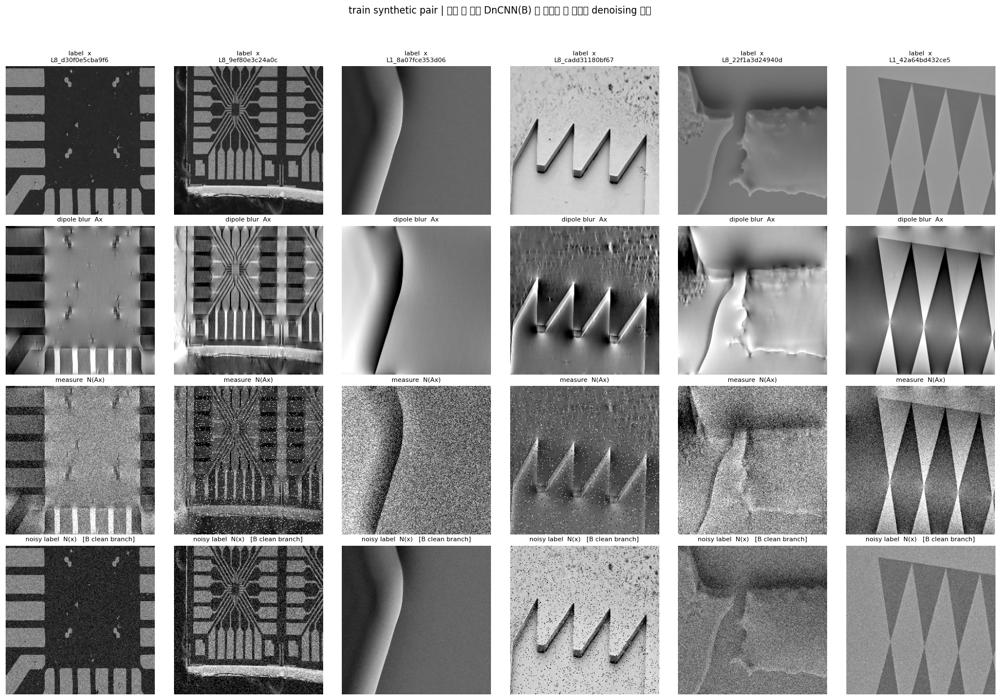

In [6]:
_train_loader, _, _train_len = get_data_wrapper_loader(
    label_split=config.train_split,
    training_mode=True,
    loader_cfg=LoaderConfig(batch=6, num_workers=0, shuffle=True),
)
print(f"train dataset length: {_train_len}")
for k, v in NOISE_RANGES.items():
    print(f"  {k:16s} sigma {v[0]} ~ {v[1]}")

_l, _m, _b, _nl, _n = next(iter(_train_loader))
print(f"label   : {tuple(_l.shape)} range [{_l.min():.3f}, {_l.max():.3f}]")
print(f"measure : {tuple(_m.shape)} range [{_m.min():.3f}, {_m.max():.3f}]")

n = _l.shape[0]
fig, axes = plt.subplots(4, n, figsize=(3 * n, 12.6))
for i in range(n):
    axes[0, i].imshow(_l[i, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    axes[0, i].set_title(f"label  x\n{_n[i][:16]}", fontsize=8)
    _bb = _b[i, 0].numpy()
    axes[1, i].imshow(_bb, cmap="gray", vmin=np.percentile(_bb, 1), vmax=np.percentile(_bb, 99))
    axes[1, i].set_title("dipole blur  Ax", fontsize=8)
    _mm = _m[i, 0].numpy()
    axes[2, i].imshow(_mm, cmap="gray", vmin=np.percentile(_mm, 1), vmax=np.percentile(_mm, 99))
    axes[2, i].set_title("measure  N(Ax)", fontsize=8)
    axes[3, i].imshow(_nl[i, 0].numpy(), cmap="gray", vmin=0, vmax=1)
    axes[3, i].set_title("noisy label  N(x)   [B clean branch]", fontsize=8)
    for r in range(4):
        axes[r, i].axis("off")
fig.suptitle("train synthetic pair | 아래 두 줄이 DnCNN(B) 이 배우는 두 종류의 denoising 입력")
fig.tight_layout(rect=(0, 0, 1, 0.95))
plt.show()

del _train_loader

## 3. Conventional methods : mean / median / adaptive filter + Wiener filter

학습 없이, forward model (`dipole_kernel`) 을 안다는 가정만으로 복원한다.

1. **denoise** : mean / median / adaptive filter
2. **deconvolve** : Wiener filter
   $$\hat{x} = \mathcal{F}^{-1}\Big\{\frac{D}{D^2 + K}\,\mathcal{F}\{y\}\Big\}$$
   `K` 는 validation set 에서 PSNR 이 최대가 되도록 sweep 해서 고른다.

In [6]:
def _as_bchw(img: Tensor) -> tuple[Tensor, int]:
    dim = img.dim()
    if dim == 2:
        return img[None, None], dim
    if dim == 3:
        return img[None], dim
    if dim == 4:
        return img, dim
    raise ValueError(f"unsupported image dim: {dim}")


def _restore_dim(img: Tensor, dim: int) -> Tensor:
    if dim == 2:
        return img[0, 0]
    if dim == 3:
        return img[0]
    return img


def mean_filter(img: Tensor, kernel_size: int = 3) -> Tensor:
    x, dim = _as_bchw(img)
    pad = kernel_size // 2
    x = functional.pad(x, (pad, pad, pad, pad), mode="reflect")
    return _restore_dim(functional.avg_pool2d(x, kernel_size=kernel_size, stride=1), dim)


def median_filter(img: Tensor, kernel_size: int = 3) -> Tensor:
    x, dim = _as_bchw(img)
    pad = kernel_size // 2
    x = functional.pad(x, (pad, pad, pad, pad), mode="reflect")
    patches = x.unfold(2, kernel_size, 1).unfold(3, kernel_size, 1)
    out = patches.reshape(*patches.shape[:4], -1).median(dim=-1).values
    return _restore_dim(out, dim)


def adaptive_filter(img: Tensor, kernel_size: int = 5, noise_var: Tensor | float | None = None) -> Tensor:
    x, dim = _as_bchw(img)
    pad = kernel_size // 2
    xp = functional.pad(x, (pad, pad, pad, pad), mode="reflect")

    local_mean = functional.avg_pool2d(xp, kernel_size=kernel_size, stride=1)
    local_sq = functional.avg_pool2d(xp.pow(2), kernel_size=kernel_size, stride=1)
    local_var = (local_sq - local_mean.pow(2)).clamp_min(0.0)

    if noise_var is None:
        noise_var = local_var.flatten(2).median(dim=-1).values[:, :, None, None]

    ratio = (noise_var / local_var.clamp_min(1e-8)).clamp(max=1.0)
    return _restore_dim(x - ratio * (x - local_mean), dim)


def wiener_deconv(img: Tensor, K: float) -> Tensor:
    """(1/D) * D^2/(D^2 + K) = D / (D^2 + K). D 가 실수라 0 나눗셈 없이 바로 쓸 수 있다."""
    kernel = dipole_kernel(tuple(img.shape[-2:])).to(img.device)
    w = kernel / (kernel**2 + K)
    img_k = torch.fft.fftn(img, dim=(-2, -1))
    return torch.fft.ifftn(img_k * w, dim=(-2, -1)).real


def tkd(img: Tensor, clip: float = 5.0) -> Tensor:
    kernel = dipole_kernel(tuple(img.shape[-2:])).to(img.device)
    kernel_inv = torch.clip(1 / kernel, min=-clip, max=clip)
    img_k = torch.fft.fftn(img, dim=(-2, -1))
    return torch.fft.ifftn(img_k * kernel_inv, dim=(-2, -1)).real


BASELINE_KERNEL: int = 3
ADAPTIVE_KERNEL: int = 5

PREFILTERS: dict[str, Callable[[Tensor], Tensor]] = {
    "none": lambda x: x,
    "mean": lambda x: mean_filter(x, kernel_size=BASELINE_KERNEL),
    "median": lambda x: median_filter(x, kernel_size=BASELINE_KERNEL),
    "adaptive": lambda x: adaptive_filter(x, kernel_size=ADAPTIVE_KERNEL),
}
PREFILTER_LABEL: dict[str, str] = {
    "none": "Wiener only",
    "mean": f"Mean {BASELINE_KERNEL}x{BASELINE_KERNEL} + Wiener",
    "median": f"Median {BASELINE_KERNEL}x{BASELINE_KERNEL} + Wiener",
    "adaptive": f"Adaptive {ADAPTIVE_KERNEL}x{ADAPTIVE_KERNEL} + Wiener",
}

### 3-1. Validation set 으로 Wiener `K` 튜닝

valid images: 100
Wiener only                        best K = 0.01778  (valid PSNR 14.899 dB, 1.2s)
Mean 3x3 + Wiener                  best K = 0.005623  (valid PSNR 18.854 dB, 0.4s)
Median 3x3 + Wiener                best K = 0.005623  (valid PSNR 18.814 dB, 0.5s)
Adaptive 5x5 + Wiener              best K = 0.01  (valid PSNR 18.793 dB, 0.5s)


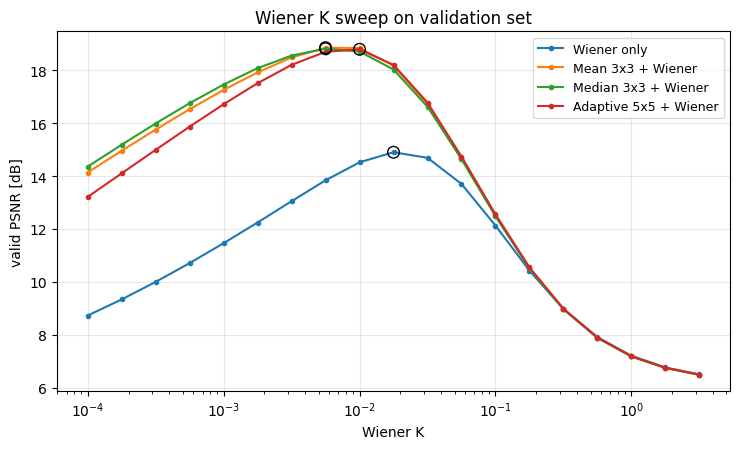

In [7]:
WIENER_K_GRID: list[float] = [float(k) for k in np.logspace(-4, 0.5, 19)]

valid_loader, valid_dataset, valid_len = get_data_wrapper_loader(
    label_split=config.valid_split,
    training_mode=False,
    loader_cfg=LoaderConfig(batch=config.valid_batch, num_workers=4, shuffle=False),
)
print(f"valid images: {valid_len}")


def sweep_wiener_K(
    loader: DataLoader,
    pre: Callable[[Tensor], Tensor],
    k_grid: list[float],
    device: torch.device,
) -> tuple[float, dict[float, float]]:
    """loader 전체에 대해 K 별 평균 PSNR 을 재고, 최대가 되는 K 를 돌려준다."""
    acc: dict[float, list[float]] = {k: [] for k in k_grid}
    with torch.no_grad():
        for _data in loader:
            label = _data[DataKey.Label].to(device, non_blocking=True)
            measure = _data[DataKey.Measure].to(device, non_blocking=True)
            filtered = pre(measure)
            for k in k_grid:
                pred = finalize(wiener_deconv(filtered, K=k))
                acc[k].extend(calculate_psnr(pred, label).flatten().tolist())
    mean_psnr = {k: float(np.mean(v)) for k, v in acc.items()}
    best_k = max(mean_psnr, key=mean_psnr.get)
    return best_k, mean_psnr


BEST_K: dict[str, float] = {}
K_CURVES: dict[str, dict[float, float]] = {}

for _key, _fn in PREFILTERS.items():
    t0 = time.time()
    _best, _curve = sweep_wiener_K(valid_loader, _fn, WIENER_K_GRID, config.device)
    BEST_K[_key] = _best
    K_CURVES[_key] = _curve
    print(f"{PREFILTER_LABEL[_key]:<34} best K = {_best:.4g}  (valid PSNR {_curve[_best]:.3f} dB, {time.time() - t0:.1f}s)")

fig, ax = plt.subplots(figsize=(7.5, 4.6))
for _key in PREFILTERS:
    _curve = K_CURVES[_key]
    ax.semilogx(list(_curve.keys()), list(_curve.values()), marker="o", ms=3, label=PREFILTER_LABEL[_key])
    ax.scatter([BEST_K[_key]], [_curve[BEST_K[_key]]], s=70, zorder=5, facecolors="none", edgecolors="k")
ax.set_xlabel("Wiener K")
ax.set_ylabel("valid PSNR [dB]")
ax.set_title("Wiener K sweep on validation set")
ax.grid(alpha=0.3)
ax.legend(fontsize=9)
fig.tight_layout()
plt.show()

### 3-2. Test set 에서 conventional methods results

In [8]:
def conventional_predict(measure: Tensor) -> dict[str, Tensor]:
    """튜닝된 K 로 conventional 결과를 한 번에 만든다."""
    out = {"measure": finalize(measure)}
    for key, fn in PREFILTERS.items():
        out[f"conv_{key}"] = finalize(wiener_deconv(fn(measure), K=BEST_K[key]))
    return out


CONV_METHODS: list[str] = ["measure", *[f"conv_{k}" for k in PREFILTERS]]
CONV_LABEL: dict[str, str] = {"measure": "Measure (input)", **{f"conv_{k}": v for k, v in PREFILTER_LABEL.items()}}

conv_rows: list[dict] = []
with torch.no_grad():
    for _data in tqdm(test_loader, desc="conventional", unit="batch"):
        label = _data[DataKey.Label].to(config.device)
        measure = _data[DataKey.Measure].to(config.device)
        names = _data[DataKey.Name]

        preds = conventional_predict(measure)
        for i in range(label.shape[0]):
            lab_i = label[i : i + 1]
            row = {"file": names[i], "noise_type": TEST_NOISE_META.get(names[i], {}).get("noise_type", "unknown")}
            for key in CONV_METHODS:
                p = preds[key][i : i + 1]
                row[f"psnr_{key}"] = calculate_psnr(p, lab_i).item()
                row[f"ssim_{key}"] = calculate_ssim(p, lab_i).item()
            conv_rows.append(row)


def print_metric_table(rows: list[dict], methods: list[str], labels: dict[str, str], width: int = 34) -> None:
    print(f"{'method':<{width}}{'n':>5}{'PSNR':>10}{'+-':>9}{'SSIM':>10}{'+-':>9}")
    print("-" * (width + 43))
    for key in methods:
        psnr = [r[f"psnr_{key}"] for r in rows]
        ssim = [r[f"ssim_{key}"] for r in rows]
        print(
            f"{labels[key]:<{width}}{len(rows):>5}"
            f"{np.mean(psnr):>10.3f}{np.std(psnr, ddof=1):>9.3f}"
            f"{np.mean(ssim):>10.4f}{np.std(ssim, ddof=1):>9.4f}"
        )


print()
print_metric_table(conv_rows, CONV_METHODS, CONV_LABEL)

conventional:   0%|          | 0/25 [00:00<?, ?batch/s]


method                                n      PSNR       +-      SSIM       +-
-----------------------------------------------------------------------------
Measure (input)                     100     8.161    2.002   -0.0143   0.1460
Wiener only                         100    15.228    3.965    0.4146   0.2540
Mean 3x3 + Wiener                   100    19.256    4.186    0.5296   0.2134
Median 3x3 + Wiener                 100    19.288    5.029    0.5453   0.2553
Adaptive 5x5 + Wiener               100    19.088    3.721    0.5512   0.2053


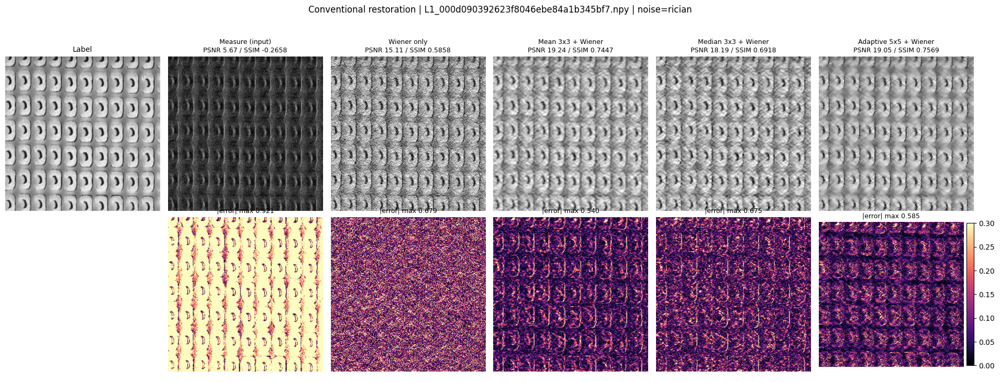

In [9]:
# 대표 sample 하나로 conventional 결과를 눈으로 확인한다
_label, _measure, _blur, _noisy_label, _name = test_dataset[SAMPLE_IDX]
_lab_t = _label[None].to(config.device)
_mea_t = _measure[None].to(config.device)
with torch.no_grad():
    _preds = conventional_predict(_mea_t)

lab = _lab_t.cpu().numpy().squeeze()
n_col = 1 + len(CONV_METHODS)
fig, axes = plt.subplots(2, n_col, figsize=(3.2 * n_col, 7.4))
axes[0, 0].imshow(lab, cmap="gray", vmin=0, vmax=1)
axes[0, 0].set_title("Label", fontsize=10)
axes[0, 0].axis("off")
axes[1, 0].axis("off")

for c, key in enumerate(CONV_METHODS):
    img = _preds[key].cpu().numpy().squeeze()
    p = calculate_psnr(_preds[key], _lab_t).item()
    s = calculate_ssim(_preds[key], _lab_t).item()
    err = np.abs(img - lab)
    axes[0, c + 1].imshow(img, cmap="gray", vmin=0, vmax=1)
    axes[0, c + 1].set_title(f"{CONV_LABEL[key]}\nPSNR {p:.2f} / SSIM {s:.4f}", fontsize=9)
    axes[0, c + 1].axis("off")
    im = axes[1, c + 1].imshow(err, cmap="magma", vmin=0, vmax=0.3)
    axes[1, c + 1].set_title(f"|error| max {err.max():.3f}", fontsize=9)
    axes[1, c + 1].axis("off")
fig.colorbar(im, ax=axes[1, -1], fraction=0.046, pad=0.02)
fig.suptitle(f"Conventional restoration | {_name} | noise={TEST_NOISE_META.get(_name, {}).get('noise_type', '?')}", fontsize=12)
fig.tight_layout(rect=(0, 0, 1, 0.94))
plt.show()

## 4. Methods using network

공통 building block 은 `train_deconvolution_example.ipynb` 의 U-Net,
`train_denoising_example.ipynb` 의 DnCNN 을 그대로 쓴다.

| | 방법 | 설명 |
|---|---|---|
| **A** | End2End U-Net | measure -> label 을 그냥 U-Net 으로 회귀 |
| **B** | DnCNN denoise + Wiener deconvolution | measurement domain 에서 noise 만 학습으로 제거하고, deconvolution 은 Wiener filter |

In [10]:
class ConvBlock(nn.Module):
    def __init__(self, in_chans: int, out_chans: int) -> None:
        super().__init__()
        self.layers = nn.Sequential(
            nn.Conv2d(in_chans, out_chans, kernel_size=3, padding=1),
            nn.GroupNorm(4, out_chans),
            nn.SiLU(inplace=True),
            nn.Conv2d(out_chans, out_chans, kernel_size=3, padding=1),
            nn.GroupNorm(4, out_chans),
            nn.SiLU(inplace=True),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.layers(x)


def create_down_sample_layers(in_chans: int, chans: int, num_pool_layers: int) -> nn.ModuleList:
    layers = nn.ModuleList([ConvBlock(in_chans, chans)])
    ch = chans
    for _ in range(num_pool_layers - 1):
        layers.append(ConvBlock(ch, ch * 2))
        ch *= 2
    return layers


def create_up_sample_layers(chans: int, num_pool_layers: int) -> nn.ModuleList:
    layers = nn.ModuleList()
    ch = chans * (2 ** (num_pool_layers - 1))
    for _ in range(num_pool_layers - 1):
        layers.append(ConvBlock(ch * 2, ch // 2))
        ch //= 2
    layers.append(ConvBlock(ch * 2, ch))
    return layers


class Unet(nn.Module):
    def __init__(self, in_chans: int = 1, out_chans: int = 1, chans: int = 32, num_pool_layers: int = 4) -> None:
        super().__init__()
        self.in_chans = in_chans
        self.out_chans = out_chans
        self.num_pool_layers = num_pool_layers

        self.down_sample_layers = create_down_sample_layers(in_chans, chans, num_pool_layers)
        self.bottleneck_conv = ConvBlock(chans * (2 ** (num_pool_layers - 1)), chans * (2 ** (num_pool_layers - 1)))
        self.up_sample_layers = create_up_sample_layers(chans, num_pool_layers)
        self.final_conv = nn.Sequential(
            nn.Conv2d(chans, chans, kernel_size=3, padding=1),
            nn.GroupNorm(4, chans),
            nn.SiLU(inplace=True),
            nn.Conv2d(chans, out_chans, kernel_size=1, padding=0),
        )

    def forward(self, x: Tensor) -> Tensor:
        stack = []
        output = x
        for layer in self.down_sample_layers:
            output = layer(output)
            stack.append(output)
            output = functional.max_pool2d(output, kernel_size=2)

        output = self.bottleneck_conv(output)

        for layer in self.up_sample_layers:
            downsampled_output = stack.pop()
            output = functional.interpolate(
                output, size=downsampled_output.shape[-2:], mode="bilinear", align_corners=False
            )
            output = torch.cat([output, downsampled_output], dim=1)
            output = layer(output)

        return self.final_conv(output)


class DnCNN(nn.Module):
    def __init__(self, channels: int, num_of_layers: int, kernel_size: int, padding: int, features: int) -> None:
        super().__init__()
        layers: list[nn.Module] = [
            nn.Conv2d(channels, features, kernel_size=kernel_size, padding=padding, bias=False),
            nn.SiLU(inplace=True),
        ]
        for _ in range(num_of_layers - 1):
            layers += [
                nn.Conv2d(features, features, kernel_size=kernel_size, padding=padding, bias=False),
                nn.GroupNorm(4, features),
                nn.SiLU(inplace=True),
            ]
        layers.append(nn.Conv2d(features, channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.dncnn = nn.Sequential(*layers)

    def forward(self, x: Tensor) -> Tensor:
        if x.dim() != 4:
            raise ValueError(f"Input tensor must be 4D, but got {x.dim()}D tensor.")
        return x + self.dncnn(x)

## 4-1. [보충] USRNet (method C 의 모델)

공식 cszn/USRNet 의 `network_usrnet_v1.py` 를 **무수정 import** 하고 (`Day3/usrnet/` 에
공식 코드 + 공식 `usrnet.pth` pretrained 다운로드됨), 과제 연결은 래퍼가 바깥에서만 처리한다
— 팀원 Day2 검증 레시피: gray→RGB 3채널 반복 / dipole PSF 를 k 로 / sf=1 / 출력 3채널 평균.
dipole OTF → 공간 PSF 변환은 공식 `p2o` 가 OTF 를 오차 2e-7 로 재현함을 로컬 검증했다.


In [11]:
import sys

if str(config.usrnet_dir) not in sys.path:
    sys.path.insert(0, str(config.usrnet_dir))

from network_usrnet_v1 import USRNet  # 공식 파일 무수정 import


class USRNetWrapper(nn.Module):
    """공식 USRNet 무수정 + 과제 연결 래퍼. forward(measure, sigma)."""

    def __init__(self, pretrained: bool = True) -> None:
        super().__init__()
        self.net = USRNet(
            n_iter=8, h_nc=64, in_nc=4, out_nc=3,
            nc=[64, 128, 256, 512], nb=2,
            act_mode="R", downsample_mode="strideconv", upsample_mode="convtranspose",
        )
        if pretrained:
            state = torch.load(str(config.usrnet_dir / "usrnet.pth"), map_location="cpu", weights_only=True)
            self.net.load_state_dict(state, strict=True)
        self._psf_cache: dict[tuple[int, int], Tensor] = {}

    def _dipole_psf(self, shape: tuple[int, int]) -> Tensor:
        if shape not in self._psf_cache:
            D = dipole_kernel(shape)
            psf = torch.fft.ifft2(D).real
            self._psf_cache[shape] = torch.fft.fftshift(psf)[None, None]  # 1x1xHxW
        return self._psf_cache[shape]

    def forward(self, measure: Tensor, sigma: Tensor) -> Tensor:
        x = measure.repeat(1, 3, 1, 1)
        k = self._dipole_psf(tuple(measure.shape[-2:])).to(measure.device)
        out = self.net(x, k, sf=1, sigma=sigma.to(measure.device))
        return out.mean(dim=1, keepdim=True)


_m = USRNetWrapper(pretrained=True)
print(f"USRNetWrapper parameters: {sum(p.numel() for p in _m.parameters()) / 1e6:.2f} M (공식 pretrained)")
with torch.no_grad():
    print("forward shape:", tuple(_m(torch.randn(2, 1, 64, 64), torch.full((2, 1, 1, 1), 0.05)).shape))
del _m

USRNetWrapper parameters: 17.02 M (공식 pretrained)
forward shape: (2, 1, 64, 64)


## 4-2. [보충] Blind sigma 추정 — cone 추정기 + val 보정

`noise_meta.json` 은 결과 분석 전용이므로 USRNet 의 sigma 입력을 **measure 만으로** 추정한다.

물리: dipole kernel 은 magic angle(약 54.7°) 자리에서 `D(k) = 0` 이라, measure 의 k-space
`X·D + N` 중 그 자리에는 **노이즈 N 만 남는다** (공식 셀 1-1 이 출력하는 `|D| < 0.01 비율`
이 바로 이 자리의 크기다). 거기서 노이즈 std 를 직접 읽는다.

작은 sigma 에서는 신호 누설로 과대추정되는 바닥이 있어, **val 에서 (참값, 추정값) 쌍을 모아
1차식으로 보정**한다 — val 라벨 사용은 공식 노트북의 Wiener K 튜닝과 같은 방식이라 규정 안이다.


In [12]:
CONE_EPS: float = 0.01  # |D| < eps 를 cone 으로 본다 (공식 셀이 출력하는 그 비율)


@lru_cache(maxsize=8)
def _cone_mask(shape: tuple[int, int]) -> Tensor:
    D = dipole_kernel(shape)
    mask = D.abs() < CONE_EPS
    mask[0, 0] = False  # DC 는 1/3 이지만 안전하게 제외
    return mask


def estimate_sigma_cone(measure: Tensor) -> Tensor:
    """measure (Bx1xHxW) -> 노이즈 std 추정 (Bx1x1x1). 라벨/메타 불필요."""
    H, W = measure.shape[-2:]
    mask = _cone_mask((H, W)).to(measure.device)
    F = torch.fft.fftn(measure, dim=(-2, -1))
    power = (F.abs() ** 2)[..., mask].mean(dim=-1, keepdim=True)  # Bx1x1
    return torch.sqrt(power / (H * W)).unsqueeze(-1)  # Bx1x1x1


# ---- val 에서 1차 보정 계수를 구한다: sigma_true ~ a * sigma_est + b ----
def calibrate_sigma(loader: DataLoader) -> tuple[float, float]:
    est_list, true_list = [], []
    with torch.no_grad():
        for _data in loader:
            measure = _data[DataKey.Measure]
            blur = _data[DataKey.Blur]
            est = estimate_sigma_cone(measure).flatten()
            true = (measure - blur).std(dim=(1, 2, 3)).flatten()
            est_list.extend(est.tolist())
            true_list.extend(true.tolist())
    a, b = np.polyfit(est_list, true_list, deg=1)
    resid = np.array(true_list) - (a * np.array(est_list) + b)
    print(f"sigma 보정: true = {a:.3f} * est + {b:.4f} | 보정 후 잔차 std {resid.std():.4f} (n={len(est_list)})")
    return float(a), float(b)


SIGMA_CAL = calibrate_sigma(valid_loader)


def estimate_sigma(measure: Tensor) -> Tensor:
    """보정된 blind sigma 추정. 검증/test 공용."""
    a, b = SIGMA_CAL
    return (a * estimate_sigma_cone(measure) + b).clamp(1e-3, 0.3)

sigma 보정: true = 0.944 * est + 0.0082 | 보정 후 잔차 std 0.0148 (n=100)


## 5. 학습

L40S **4장 (GPU 2,3,4,5)** 기준 실측 (학습 7,268장, GPU 연산 기준):

| 모델 | params | batch | 처리량 | epoch | 100 epoch | peak / GPU |
|---|---|---|---|---|---|---|
| A. U-Net (`chans 64`) | 13.43 M | 64 | 440 img/s | 16.5초 | 약 28분 | 7.4 GiB |
| B. DnCNN (`20층, 96 feat`) | 1.58 M | 64 | 140 img/s | 52.1초 | 약 87분 | 22.6 GiB |

## 5-0. [보충] `train_model` / `SPECS`

공식 학습 셀(`RESULTS["unet_e2e"] = train_model(SPECS["unet_e2e"])`)이 쓰는 인프라.
각 spec 은 (모델 빌더, 손실, val 용 predict) 로 정의된다. best checkpoint 는
`logs_final/<이름>/` 에 저장된다.

- **A `unet_e2e`** — measure → label 회귀 (조교 체크포인트가 있으면 학습 생략 가능)
- **B `dncnn`** — 두 종류 denoising 을 함께 학습: `N(Ax)→Ax` 와 `N(x)→x` (공식 셀 8 설명).
  val 지표는 DnCNN 출력에 Wiener(K=none 의 BEST_K)를 얹은 근사치
- **C `usrnet`** — 학습 sigma 는 잔차 std 정확값 × 지터 U(0.75, 1.33) (blind 추정 오차에
  강건해지도록), val/test 는 `estimate_sigma()` blind 추정


In [14]:
@dataclass
class Spec:
    name: str
    build: Callable[[], nn.Module]
    loss_fn: Callable  # (model, data_on_device) -> scalar loss
    predict: Callable  # (model, measure) -> 복원 결과 (val/test 공용, finalize 포함)
    epochs: int
    batch: int
    lr: float


def _to_device(_data):
    return {
        "label": _data[DataKey.Label].to(config.device, non_blocking=True),
        "measure": _data[DataKey.Measure].to(config.device, non_blocking=True),
        "blur": _data[DataKey.Blur].to(config.device, non_blocking=True),
        "noisy_label": _data[DataKey.NoisyLabel].to(config.device, non_blocking=True),
    }


def evaluate_predict(predict: Callable, model: nn.Module, loader: DataLoader) -> float:
    psnrs = []
    with torch.no_grad():
        for _data in loader:
            d = _to_device(_data)
            pred = predict(model, d["measure"])
            psnrs.extend(calculate_psnr(pred, d["label"]).flatten().tolist())
    return float(np.mean(psnrs))


def train_model(spec: Spec) -> dict:
    run_dir = config.run_dir / spec.name
    os.makedirs(run_dir, exist_ok=True)

    model = spec.build().to(config.device)
    optim = torch.optim.AdamW(model.parameters(), lr=spec.lr, betas=(0.9, 0.99))

    train_loader, _, train_len = get_data_wrapper_loader(
        label_split=config.train_split,
        training_mode=True,
        loader_cfg=LoaderConfig(batch=spec.batch, num_workers=config.num_workers, shuffle=True),
    )
    print(f"[{spec.name}] params {sum(p.numel() for p in model.parameters()) / 1e6:.2f} M | "
          f"train {train_len} | epochs {spec.epochs} | batch {spec.batch} | lr {spec.lr:g}")

    best_psnr, history = -1.0, []
    for epoch in range(spec.epochs):
        model.train()
        losses = []
        for _data in tqdm(train_loader, desc=f"{spec.name} ep {epoch + 1}/{spec.epochs}", leave=False):
            optim.zero_grad()
            loss = spec.loss_fn(model, _to_device(_data))
            loss.backward()
            optim.step()
            losses.append(loss.item())

        model.eval()
        val_psnr = evaluate_predict(spec.predict, model, valid_loader)
        history.append({"epoch": epoch + 1, "loss": float(np.mean(losses)), "val_psnr": val_psnr})
        star = ""
        if val_psnr > best_psnr:
            best_psnr = val_psnr
            torch.save(model.state_dict(), run_dir / "best.ckpt")
            star = "  <- best"
        print(f"[{spec.name}] ep {epoch + 1}: loss {np.mean(losses):.4f} | val PSNR {val_psnr:.3f}{star}")

    model.load_state_dict(torch.load(run_dir / "best.ckpt", map_location=config.device, weights_only=True))
    with open(run_dir / "history.json", "w") as f:
        json.dump(history, f, indent=2)
    print(f"[{spec.name}] best val PSNR {best_psnr:.3f} | ckpt: {run_dir / 'best.ckpt'}")
    return {"model": model.eval(), "spec": spec, "best_val_psnr": best_psnr, "history": history}


l1 = torch.nn.L1Loss()


def _usrnet_train_sigma(d) -> Tensor:
    # 학습: 잔차 std 정확값 x 지터. blind 추정기의 오차 범위에 강건해지게 한다.
    sigma = (d["measure"] - d["blur"]).std(dim=(1, 2, 3), keepdim=True)  # Bx1x1x1
    jitter = torch.empty_like(sigma).uniform_(0.75, 1.33)
    return (sigma * jitter).clamp(1e-3, 0.3)


SPECS: dict[str, Spec] = {
    "unet_e2e": Spec(
        name="unet_e2e",
        build=lambda: Unet(in_chans=1, out_chans=1, chans=64, num_pool_layers=4),
        loss_fn=lambda m, d: l1(m(d["measure"]), d["label"]),
        predict=lambda m, x: finalize(m(x)),
        epochs=30, batch=64, lr=5e-4,
    ),
    "dncnn": Spec(
        name="dncnn",
        build=lambda: DnCNN(channels=1, num_of_layers=20, kernel_size=3, padding=1, features=96),
        # 공식 셀 8: DnCNN 은 N(Ax)->Ax 와 N(x)->x 두 종류의 denoising 을 함께 배운다
        loss_fn=lambda m, d: l1(m(d["measure"]), d["blur"]) + l1(m(d["noisy_label"]), d["label"]),
        # val 근사: denoise 후 Wiener. (최종 test 는 아래 평가 셀에서 K 를 val 로 다시 튜닝)
        predict=lambda m, x: finalize(wiener_deconv(m(x), K=BEST_K.get("none", 3e-2))),
        epochs=30, batch=64, lr=5e-4,
    ),
    "usrnet": Spec(
        name="usrnet",
        build=lambda: USRNetWrapper(pretrained=True),
        loss_fn=lambda m, d: l1(m(d["measure"], _usrnet_train_sigma(d)), d["label"]),
        predict=lambda m, x: finalize(m(x, estimate_sigma(x))),
        epochs=15, batch=4, lr=2e-5,  # 공식 pretrained 에서 fine-tune. OOM 없으면 batch 8
    ),
}

RESULTS: dict[str, dict] = {}

### C. [보충] USRNet fine-tune (물리 unrolling) — 자동 이어걷기

`y = x∗k + n` 복원용으로 설계된 unrolling 구조. 아래 학습 셀은 **체크포인트를 자동 감지**한다:
`logs_final/usrnet*/best.ckpt` 가 있으면 가장 최근 것에서 이어서, 없으면 공식 pretrained 에서
처음부터 시작한다. 따라서 kernel 재시작 후 Run all 만 하면 되고, 중단 후 재실행도 이 셀 하나로 된다.


In [ ]:
# ---- USRNet 학습: 체크포인트 자동 이어걷기 ----
# logs_final/usrnet*/best.ckpt 중 가장 최근 것에서 이어서 학습하고,
# 하나도 없으면 (처음 실행이면) 공식 pretrained 에서 시작한다.
# 실행할 때마다 새 폴더(usrnet_rNN)에 저장하므로 이전 best 를 덮어쓰지 않는다.
# -> 중간에 중단/크래시가 나도 이 셀을 다시 실행하면 마지막 best 부터 이어진다.
USRNET_EPOCHS = 30  # 상한. val PSNR 이 3~5 epoch 제자리면 수동 중단해도 best 는 저장되어 있다
USRNET_BATCH = 16   # A100 80GB 기준. OOM 이 나면 8 로
USRNET_LR = 4e-5    # batch 16 기준 (batch 를 절반으로 줄이면 lr 도 절반 권장)

_prev = sorted(config.run_dir.glob("usrnet*/best.ckpt"), key=lambda p: p.stat().st_mtime)
_resume_from = _prev[-1] if _prev else None


def _build_usrnet():
    m = USRNetWrapper(pretrained=(_resume_from is None))
    if _resume_from is not None:
        m.load_state_dict(torch.load(str(_resume_from), map_location="cpu", weights_only=True))
    return m


_run_name = f"usrnet_r{len(_prev):02d}"
print("시작점:", _resume_from if _resume_from else "공식 pretrained (usrnet.pth)")
print("이번 실행 저장 폴더:", config.run_dir / _run_name)

usrnet_spec = Spec(**{**SPECS["usrnet"].__dict__,
                      "name": _run_name,
                      "build": _build_usrnet,
                      "epochs": USRNET_EPOCHS,
                      "batch": USRNET_BATCH,
                      "lr": USRNET_LR})
RESULTS["usrnet"] = train_model(usrnet_spec)

시작점: /content/drive/MyDrive/플젝5/logs_final/usrnet_cont/best.ckpt
이번 실행 저장 폴더: /content/drive/MyDrive/플젝5/logs_final/usrnet_r02
[usrnet_r02] params 17.02 M | train 7268 | epochs 30 | batch 16 | lr 4e-05


usrnet_r02 ep 1/30:   0%|          | 0/455 [00:00<?, ?it/s]

[usrnet_r02] ep 1: loss 0.0332 | val PSNR 26.977  <- best


usrnet_r02 ep 2/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 2: loss 0.0328 | val PSNR 26.959


usrnet_r02 ep 3/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 3: loss 0.0339 | val PSNR 27.245  <- best


usrnet_r02 ep 4/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 4: loss 0.0323 | val PSNR 27.133


usrnet_r02 ep 5/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 5: loss 0.0326 | val PSNR 27.204


usrnet_r02 ep 6/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 6: loss 0.0322 | val PSNR 27.284  <- best


usrnet_r02 ep 7/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 7: loss 0.0314 | val PSNR 27.124


usrnet_r02 ep 8/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 8: loss 0.0314 | val PSNR 27.469  <- best


usrnet_r02 ep 9/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 9: loss 0.0311 | val PSNR 27.442


usrnet_r02 ep 10/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
Exception ignored in:     self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>

  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    if w.is_alive():    self._shutdown_workers()

  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive

      File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
assert self._parent_pid == os.getpid(), 'can only test a child process'    
if w.is_alive():AssertionError
:   File "/usr/lib/python3.13/multiprocessing/pr

[usrnet_r02] ep 10: loss 0.0309 | val PSNR 27.627  <- best


usrnet_r02 ep 11/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 11: loss 0.0313 | val PSNR 27.547


usrnet_r02 ep 12/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 12: loss 0.0306 | val PSNR 27.451


usrnet_r02 ep 13/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 13: loss 0.0309 | val PSNR 27.376


usrnet_r02 ep 14/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 14: loss 0.0305 | val PSNR 27.391


usrnet_r02 ep 15/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

[usrnet_r02] ep 15: loss 0.0299 | val PSNR 27.756  <- best


usrnet_r02 ep 16/30:   0%|          | 0/455 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.13/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7eebe45d2160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1709, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.13/dist-packages/torch/utils/data/dataloader.py", line 1692, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

## 6. [보충] Test set 통합 평가

conventional 표(공식 3-2)에 학습 방법들을 이어 붙인다. 학습을 건너뛴 방법은 자동으로 표에서
빠진다. A 는 조교 체크포인트가 도착하면 `TA_UNET_CKPT` 경로만 지정해 함께 평가할 수 있다.
noise_meta 는 공식 지시대로 **노이즈 종류별 분해(결과 분석)** 에만 쓴다.


In [15]:
# ---- 평가 전용: 학습 없이 최신 best 를 RESULTS 에 로드 ----
_prev = sorted(config.run_dir.glob("usrnet*/best.ckpt"), key=lambda p: p.stat().st_mtime)
_ckpt = _prev[-1]
_m = USRNetWrapper(pretrained=False)
_m.load_state_dict(torch.load(str(_ckpt), map_location="cpu", weights_only=True))
RESULTS["usrnet"] = {"model": _m.to(config.device).eval(),
                     "spec": SPECS["usrnet"], "best_val_psnr": None}
print("loaded:", _ckpt)


loaded: /content/drive/MyDrive/플젝5/logs_final/usrnet_r02/best.ckpt


In [16]:
# 조교가 제공하는 A(U-Net e2e) 체크포인트가 있으면 경로 지정 (state_dict 형식 가정)
TA_UNET_CKPT: Path | None = None  # 예: ROOT / "checkpoint_unet_e2e.ckpt"

if TA_UNET_CKPT is not None and Path(TA_UNET_CKPT).exists() and "unet_e2e" not in RESULTS:
    _net = Unet(in_chans=1, out_chans=1, chans=64, num_pool_layers=4).to(config.device)
    _net.load_state_dict(torch.load(TA_UNET_CKPT, map_location=config.device, weights_only=True))
    RESULTS["unet_e2e"] = {"model": _net.eval(), "spec": SPECS["unet_e2e"], "best_val_psnr": None}
    print(f"조교 체크포인트 로드: {TA_UNET_CKPT}")

# B 는 test 직전에 val 에서 K 를 제대로 튜닝한다 (denoise 된 입력의 최적 K 는 훨씬 작다)
if "dncnn" in RESULTS:
    _dn = RESULTS["dncnn"]["model"]
    _best_k_dn, _ = sweep_wiener_K(
        valid_loader, lambda x: _dn(x), WIENER_K_GRID, config.device
    )
    print(f"DnCNN+Wiener 최종 K = {_best_k_dn:.4g}")
    RESULTS["dncnn"]["spec"] = Spec(
        **{**RESULTS["dncnn"]["spec"].__dict__,
           "predict": lambda m, x, _k=_best_k_dn: finalize(wiener_deconv(m(x), K=_k))},
    )

NET_LABEL = {"unet_e2e": "A. U-Net end2end", "dncnn": "B. DnCNN + Wiener", "usrnet": "C. USRNet (ours)"}

net_rows: list[dict] = []
with torch.no_grad():
    for _data in tqdm(test_loader, desc="network test", unit="batch"):
        d = _to_device(_data)
        names = _data[DataKey.Name]
        preds = {k: r["spec"].predict(r["model"], d["measure"]) for k, r in RESULTS.items()}
        for i in range(d["label"].shape[0]):
            lab_i = d["label"][i : i + 1]
            row = {"file": names[i],
                   "noise_type": TEST_NOISE_META.get(names[i], {}).get("noise_type", "unknown")}
            for k, p in preds.items():
                row[f"psnr_{k}"] = calculate_psnr(p[i : i + 1], lab_i).item()
                row[f"ssim_{k}"] = calculate_ssim(p[i : i + 1], lab_i).item()
            net_rows.append(row)

# ---- 통합 표: conventional + network ----
print()
print_metric_table(conv_rows, CONV_METHODS, CONV_LABEL)
if net_rows:
    print_metric_table(net_rows, list(RESULTS.keys()), NET_LABEL)

# ---- 노이즈 종류별 분해 (noise_meta 는 여기 결과 분석에만 사용) ----
if net_rows:
    _types = ["gaussian", "rician", "uniform", "salt_and_pepper"]
    print()
    print(f"{'method':<24}" + "".join(f"{t[:10]:>12}" for t in _types))
    print("-" * (24 + 12 * len(_types)))
    for k in RESULTS:
        vals = []
        for t in _types:
            sub = [r[f"psnr_{k}"] for r in net_rows if r["noise_type"] == t]
            vals.append(np.mean(sub) if sub else float("nan"))
        print(f"{NET_LABEL[k]:<24}" + "".join(f"{v:>12.2f}" for v in vals))

os.makedirs(config.run_dir, exist_ok=True)
with open(config.run_dir / "test_metrics_networks.json", "w") as f:
    json.dump(net_rows, f, indent=2)
print(f"\nsaved: {config.run_dir / 'test_metrics_networks.json'}")

network test:   0%|          | 0/25 [00:00<?, ?batch/s]


method                                n      PSNR       +-      SSIM       +-
-----------------------------------------------------------------------------
Measure (input)                     100     8.161    2.002   -0.0143   0.1460
Wiener only                         100    15.228    3.965    0.4146   0.2540
Mean 3x3 + Wiener                   100    19.256    4.186    0.5296   0.2134
Median 3x3 + Wiener                 100    19.288    5.029    0.5453   0.2553
Adaptive 5x5 + Wiener               100    19.088    3.721    0.5512   0.2053
method                                n      PSNR       +-      SSIM       +-
-----------------------------------------------------------------------------
C. USRNet (ours)                    100    27.993    5.592    0.8697   0.1299

method                      gaussian      rician     uniform  salt_and_p
------------------------------------------------------------------------
C. USRNet (ours)               30.71       22.65       29.72       28.90

### 6-1. [보충] 시각화 — before / after / difference map

공식 팁: "결과 test 이미지는 꼭 visualize, difference map 과 zoom-in".


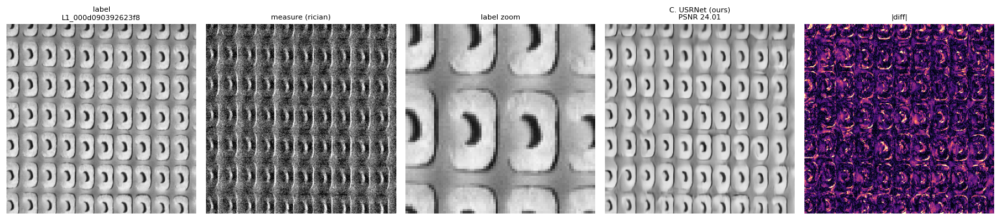

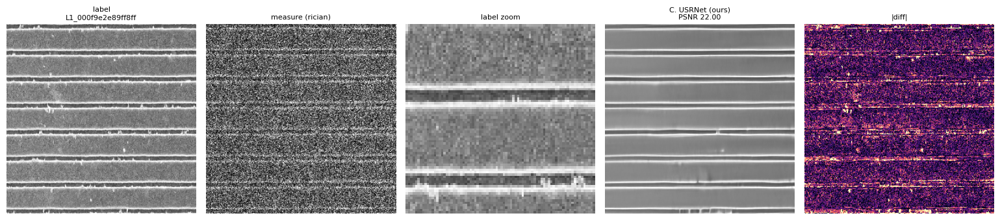

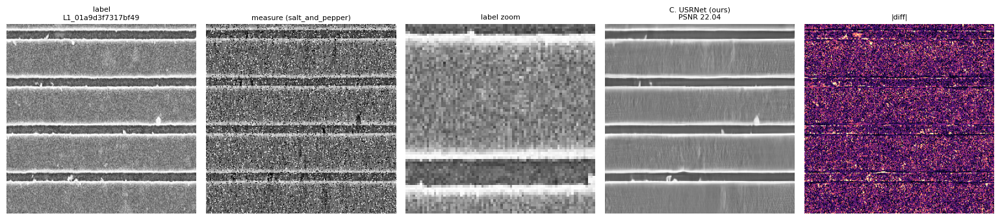

In [17]:
N_SHOW = 3
ZOOM = (slice(80, 160), slice(80, 160))  # zoom-in 영역 (원하는 곳으로 조정)

_data = next(iter(test_loader))
d = _to_device(_data)
names = _data[DataKey.Name]

with torch.no_grad():
    preds = {k: r["spec"].predict(r["model"], d["measure"]) for k, r in RESULTS.items()}

for i in range(min(N_SHOW, d["label"].shape[0])):
    lab = d["label"][i, 0].cpu().numpy()
    mea = d["measure"][i, 0].cpu().numpy()
    ncol = 3 + 2 * len(preds)
    fig, axes = plt.subplots(1, ncol, figsize=(3.1 * ncol, 3.6))
    axes[0].imshow(lab, cmap="gray", vmin=0, vmax=1)
    axes[0].set_title(f"label\n{names[i][:18]}", fontsize=8)
    axes[1].imshow(mea, cmap="gray", vmin=np.percentile(mea, 1), vmax=np.percentile(mea, 99))
    _nt = TEST_NOISE_META.get(names[i], {}).get("noise_type", "?")
    axes[1].set_title(f"measure ({_nt})", fontsize=8)
    axes[2].imshow(lab[ZOOM], cmap="gray", vmin=0, vmax=1)
    axes[2].set_title("label zoom", fontsize=8)
    c = 3
    for k, p in preds.items():
        out = p[i, 0].cpu().numpy()
        axes[c].imshow(out, cmap="gray", vmin=0, vmax=1)
        _p = calculate_psnr(p[i : i + 1], d["label"][i : i + 1]).item()
        axes[c].set_title(f"{NET_LABEL[k]}\nPSNR {_p:.2f}", fontsize=8)
        axes[c + 1].imshow(np.abs(out - lab), cmap="magma", vmin=0, vmax=0.2)
        axes[c + 1].set_title("|diff|", fontsize=8)
        c += 2
    for ax in axes:
        ax.axis("off")
    fig.tight_layout()
    plt.show()

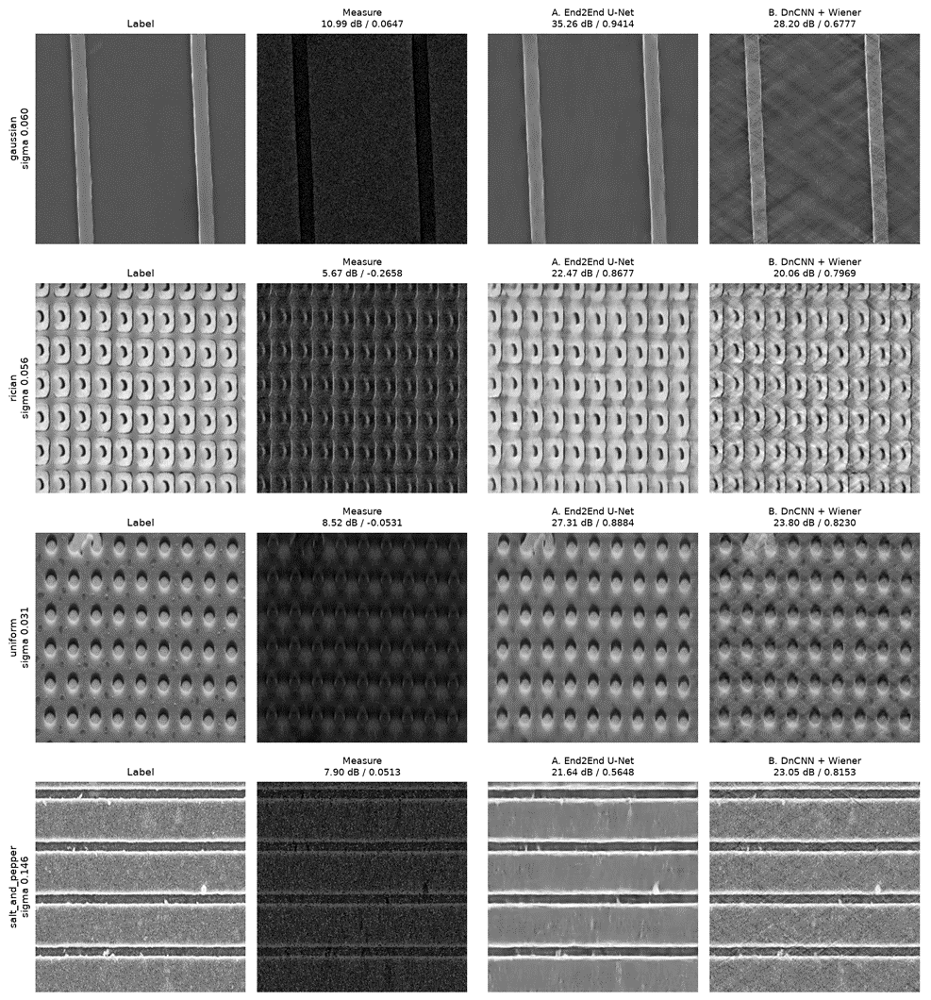

### 6-2. [보충] 노이즈 종류별 USRNet 복원 샘플 뷰어

`usrnet_viewer.ipynb` 의 샘플 뷰어를 이 노트북 환경에 맞게 옮긴 셀.
noise_meta 로 **노이즈 종류별로 `N_PER_TYPE` 장씩** 골라 (결과 분석 용도 — 규정 안),
USRNet 복원 결과를 label / measure / 복원 / |오차| / zoom 5패널로 그린다.
제목에는 blind sigma 추정값과 PSNR 변화(입력 → 복원)를 함께 표시한다.
`SAMPLE_FILES` 에 파일명 리스트를 직접 넣으면 그 이미지들만 본다.

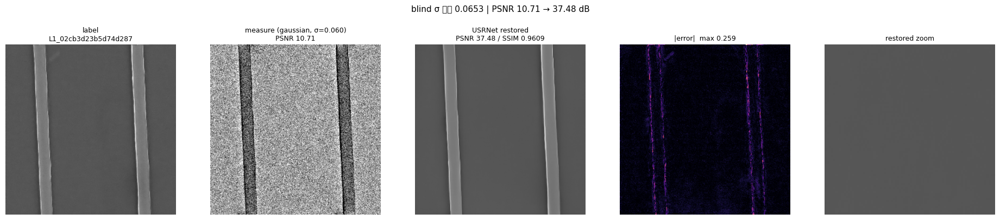

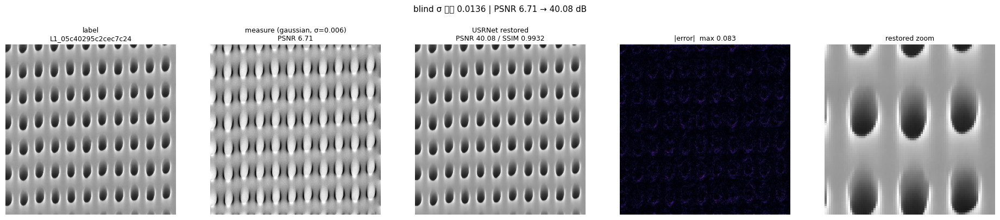

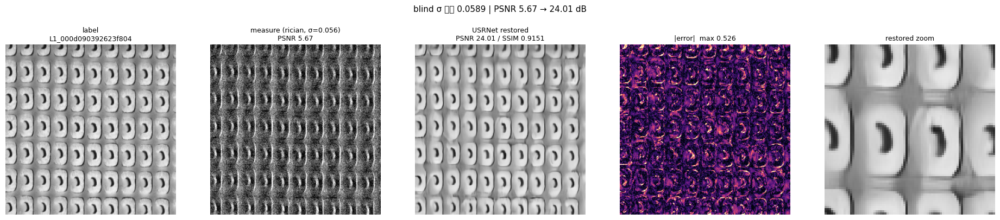

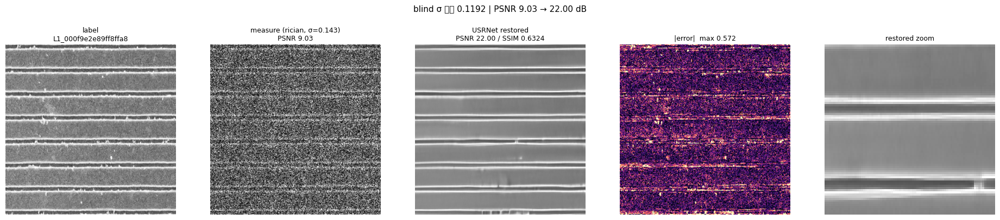

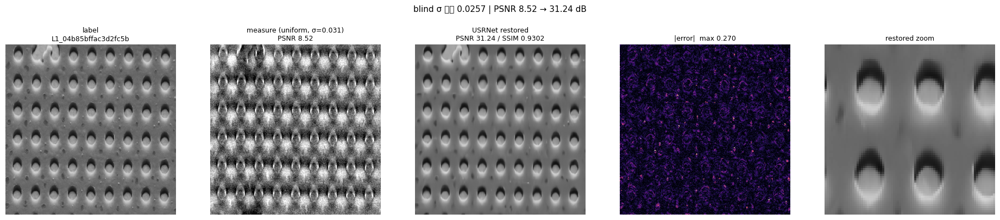

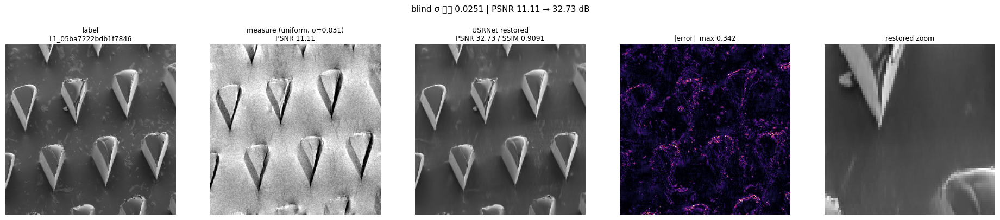

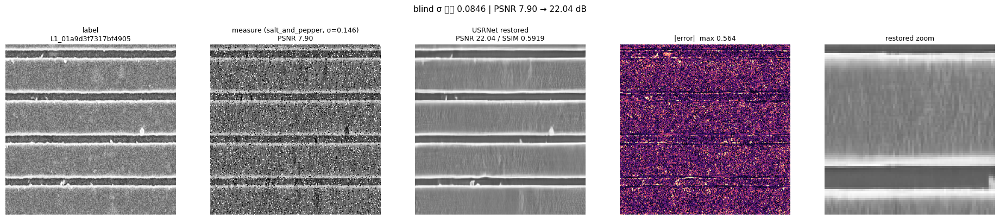

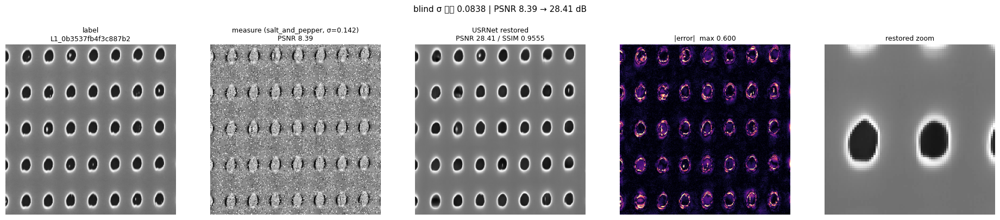

file                                    noise                 PSNR    SSIM
--------------------------------------------------------------------------
L1_02cb3d23b5d74d2875052f767acf48c2.npy gaussian             37.48  0.9609
L1_05c40295c2cec7c2404d3c168273a1e0.npy gaussian             40.08  0.9932
L1_000d090392623f8046ebe84a1b345bf7.npy rician               24.01  0.9151
L1_000f9e2e89ff8ffa8e3b9a6ac12bf490.npy rician               22.00  0.6324
L1_04b85bffac3d2fc5bca3d16fe9502ca5.npy uniform              31.24  0.9302
L1_05ba7222bdb1f78467d9ff228c8f67dc.npy uniform              32.73  0.9091
L1_01a9d3f7317bf4905b707e63524d610f.npy salt_and_pepper      22.04  0.5919
L1_0b3537fb4f3c887b23f6e414fc4ca2d0.npy salt_and_pepper      28.41  0.9555
--------------------------------------------------------------------------
샘플 평균                                                        29.75  0.8610


In [18]:
N_PER_TYPE = 2
VIEW_ZOOM = (slice(80, 160), slice(80, 160))  # zoom-in 영역 (원하는 곳으로 조정)
SAMPLE_FILES: list[str] | None = None         # 예: ["L1_000d09....npy"]

_name_to_idx = {Path(p).name: i for i, p in enumerate(test_dataset.file_list)}

if SAMPLE_FILES is None:
    if TEST_NOISE_META:  # 종류별로 고르게 뽑는다 (noise_meta 는 결과 분석 전용)
        SAMPLE_FILES = []
        for _t in ["gaussian", "rician", "uniform", "salt_and_pepper"]:
            _files = sorted(f for f, m in TEST_NOISE_META.items() if m["noise_type"] == _t)
            SAMPLE_FILES += _files[:N_PER_TYPE]
    else:
        SAMPLE_FILES = sorted(_name_to_idx)[: 4 * N_PER_TYPE]

_usr_model = RESULTS["usrnet"]["model"]
_viewer_rows = []
for _fname in SAMPLE_FILES:
    _label, _measure, *_ = test_dataset[_name_to_idx[_fname]]
    _label = _label[None].to(config.device)
    _measure = _measure[None].to(config.device)
    with torch.no_grad():
        _sigma = estimate_sigma(_measure)
        _restored = finalize(_usr_model(_measure, _sigma))

    _p_in = calculate_psnr(_measure, _label).item()
    _p_out = calculate_psnr(_restored, _label).item()
    _s_out = calculate_ssim(_restored, _label).item()
    _info = TEST_NOISE_META.get(_fname, {})
    _viewer_rows.append({"file": _fname, "noise": _info.get("noise_type", "?"),
                         "psnr": _p_out, "ssim": _s_out})

    _lab = _label[0, 0].cpu().numpy()
    _mea = _measure[0, 0].cpu().numpy()
    _out = _restored[0, 0].cpu().numpy()
    _err = np.abs(_out - _lab)

    fig, axes = plt.subplots(1, 5, figsize=(19, 4.1))
    axes[0].imshow(_lab, cmap="gray", vmin=0, vmax=1)
    axes[0].set_title(f"label\n{_fname[:20]}", fontsize=9)
    axes[1].imshow(_mea, cmap="gray", vmin=np.percentile(_mea, 1), vmax=np.percentile(_mea, 99))
    axes[1].set_title(f"measure ({_info.get('noise_type', '?')}, σ={_info.get('sigma', float('nan')):.3f})\n"
                      f"PSNR {_p_in:.2f}", fontsize=9)
    axes[2].imshow(_out, cmap="gray", vmin=0, vmax=1)
    axes[2].set_title(f"USRNet restored\nPSNR {_p_out:.2f} / SSIM {_s_out:.4f}", fontsize=9)
    axes[3].imshow(_err, cmap="magma", vmin=0, vmax=0.2)
    axes[3].set_title(f"|error|  max {_err.max():.3f}", fontsize=9)
    axes[4].imshow(_out[VIEW_ZOOM], cmap="gray", vmin=0, vmax=1)
    axes[4].set_title("restored zoom", fontsize=9)
    for ax in axes:
        ax.axis("off")
    fig.suptitle(f"blind σ 추정 {float(_sigma):.4f} | PSNR {_p_in:.2f} → {_p_out:.2f} dB", fontsize=11)
    fig.tight_layout(rect=(0, 0, 1, 0.92))
    plt.show()

# ---- 샘플 요약 표 ----
print(f"{'file':<40}{'noise':<18}{'PSNR':>8}{'SSIM':>8}")
print("-" * 74)
for _r in _viewer_rows:
    print(f"{_r['file']:<40}{_r['noise']:<18}{_r['psnr']:>8.2f}{_r['ssim']:>8.4f}")
print("-" * 74)
print(f"{'샘플 평균':<58}{np.mean([_r['psnr'] for _r in _viewer_rows]):>8.2f}"
      f"{np.mean([_r['ssim'] for _r in _viewer_rows]):>8.4f}")

## 7. [보충] TTA (Test-Time Augmentation)

학습을 다시 하지 않고 점수를 올리는 방법. 같은 사진을 **뒤집어서 여러 번 복원한 뒤,
결과를 다시 되돌려서 평균**을 낸다. 신경망은 뒤집힌 입력에 대해 미묘하게 다른 실수를 하는데,
그 실수들이 평균에서 서로 상쇄된다.

### 왜 "뒤집기"만 쓰고 "회전/전치"는 안 쓰나

TTA 가 성립하려면 열화 연산이 그 변환에 대해 **대칭**이어야 한다. 즉

$$A(\text{뒤집기}(x)) = \text{뒤집기}(A(x))$$

가 성립해야 뒤집은 사진을 복원한 결과를 되돌렸을 때 원래 답과 같아진다.

dipole kernel 은

$$D(k) = \frac{1}{3} - \frac{(k \cdot \hat{B_0})^2}{|k|^2}$$

이고 `B0_dir = (0, 1)` 이라 **X 와 Y 의 역할이 서로 다르다**.

- **상하 뒤집기 / 좌우 뒤집기** : `D` 가 `X²`, `Y²` 에만 의존하므로 부호가 바뀌어도 `D` 는 그대로 → **대칭 성립**
- **전치(transpose) / 90도 회전** : X 와 Y 가 뒤바뀌므로 `D` 자체가 다른 커널이 된다 → **대칭 깨짐. 쓰면 안 된다**

따라서 쓸 수 있는 변형은 `{원본, 좌우, 상하, 둘 다}` 총 **4장**이다.
(Day1 denoising 때는 블러가 없어서 8방향 전부 쓸 수 있었지만, 여기서는 4방향이 상한이다.)

아래 셀에서 이걸 **말이 아니라 숫자로** 확인한 뒤 적용한다.


### 7-0. 실행 순서 (커널을 새로 켠 경우)

**이 노트북은 위쪽 셀에서 만든 변수들을 그대로 쓴다.** 커널을 새로 켜고 셀 44 부터
바로 돌리면 `NameError` 가 난다. 학습은 다시 할 필요가 없으므로 아래 셀만 순서대로 돌리면 된다.

| 셀 | 하는 일 | 대략 시간 |
|---|---|---|
| 3 | import · `config` · (Colab) 데이터 압축 해제 | 데이터 복사에 몇 분 |
| 5 | `dipole_kernel` / `dipole_forward` | 즉시 |
| 7 | 노이즈 4종 · `DegradationSimulator` | 즉시 |
| 9 | PSNR / SSIM / `finalize` | 즉시 |
| 11 | 데이터로더 · `test_loader` · `TEST_NOISE_META` | 즉시 |
| 15 | conventional 필터 · `wiener_deconv` | 즉시 |
| 17 | `valid_loader` 생성 + Wiener K 튜닝 | 수 분 |
| 19 | `print_metric_table` 정의 + conventional 표 | 1~2 분 |
| 24 | `USRNetWrapper` 정의 | 즉시 |
| 26 | blind sigma 추정기 + val 보정 | 수십 초 |
| **43~48** | **TTA (여기부터가 이번에 추가한 것)** | 추론 4회분 |

**건너뛸 셀**: 13 (학습 데이터 미리보기), 20 · 36~42 (시각화), 22 · 29 (A/B 모델 정의),
**31 (학습 — 절대 다시 돌리지 말 것)**, 33 · 34 (기존 평가 — 돌려도 되지만 TTA 셀이 다시 한다)

**Colab 이면**: 셀 3 의 `NEEDED_SPLITS` 에서 `"train"` 을 빼면 압축 해제가 훨씬 빨라진다
(학습을 안 하므로 train split 이 필요 없다. 단 그 경우 셀 13 은 반드시 건너뛸 것).

```python
NEEDED_SPLITS = ["val", "test_label"]   # 학습 안 할 때
```

아래 셀이 **필요한 게 다 있는지 확인**해 준다. 빠진 게 있으면 어느 셀을 돌려야 하는지 알려준다.


In [13]:
# ---- 준비 확인: TTA 셀에 필요한 것이 다 있는지 먼저 본다 ----
_need = {
    "config": 3, "torch": 3, "np": 3, "time": 3, "tqdm": 3,
    "dipole_forward": 5,
    "DegradationSimulator": 7,
    "calculate_psnr": 9, "calculate_ssim": 9, "finalize": 9,
    "DataKey": 11, "test_loader": 11, "test_dataset": 11, "TEST_NOISE_META": 11,
    "valid_loader": 17,
    "print_metric_table": 19,
    "USRNetWrapper": 24,
    "estimate_sigma": 26, "SIGMA_CAL": 26,
}
_missing = {n: c for n, c in _need.items() if n not in globals()}

if _missing:
    print("아직 준비가 안 됐다. 아래 셀을 순서대로 먼저 실행할 것:\n")
    for _c in sorted(set(_missing.values())):
        _what = ", ".join(n for n, v in _missing.items() if v == _c)
        print(f"  셀 {_c:>2} 실행  ->  {_what}")
    raise RuntimeError(f"필요한 셀 미실행: {sorted(set(_missing.values()))}")

_ck = sorted(config.run_dir.glob("usrnet*/best.ckpt"), key=lambda p: p.stat().st_mtime)
print("준비 완료 — 필요한 것 전부 있음")
print(f"  test 이미지   : {len(test_dataset)} 장")
print(f"  device       : {config.device}")
print(f"  sigma 보정계수 : true = {SIGMA_CAL[0]:.3f} * est + {SIGMA_CAL[1]:.4f}")
print(f"  체크포인트     : {_ck[-1] if _ck else '없음 (셀 31 학습 필요)'}")
if len(_ck) > 1:
    print(f"                 (총 {len(_ck)}개 중 가장 최근 것을 쓴다)")

준비 완료 — 필요한 것 전부 있음
  test 이미지   : 100 장
  device       : cuda
  sigma 보정계수 : true = 0.944 * est + 0.0082
  체크포인트     : /content/drive/MyDrive/플젝5/logs_final/usrnet_r02/best.ckpt
                 (총 3개 중 가장 최근 것을 쓴다)


In [14]:
# ---- TTA 가 성립하는지 먼저 검증한다 (숫자로) ----
# A(뒤집기(x)) 와 뒤집기(A(x)) 가 같아야 뒤집어서 복원 -> 되돌리기 가 성립한다.
_x = test_dataset[0][DataKey.Label][None].to(config.device)
_scale = float(dipole_forward(_x).abs().max())

print("dipole 연산이 각 변환에 대해 대칭인지 확인")
print(f"(신호 크기 {_scale:.4f} 와 비교해서 읽을 것)\n")

_checks = [
    ("좌우 뒤집기", lambda t: torch.flip(t, (-1,))),
    ("상하 뒤집기", lambda t: torch.flip(t, (-2,))),
    ("둘 다 뒤집기", lambda t: torch.flip(t, (-2, -1))),
    ("전치 (90도 회전급)", lambda t: t.transpose(-2, -1)),
]
for _name, _tf in _checks:
    _lhs = dipole_forward(_tf(_x))          # 먼저 변환하고 열화
    _rhs = _tf(dipole_forward(_x))          # 먼저 열화하고 변환
    _err = float((_lhs - _rhs).abs().max())
    _ok = _err < 1e-5 * max(_scale, 1e-8)
    print(f"  {_name:<20} 최대오차 {_err:.3e}   -> {'OK  (TTA 에 써도 됨)' if _ok else '틀림 (쓰면 안 됨)'}")

print("\n결론: 뒤집기 3종 + 원본 = 4장까지만 TTA 에 쓴다. 전치/회전은 제외.")
del _x

dipole 연산이 각 변환에 대해 대칭인지 확인
(신호 크기 0.6359 와 비교해서 읽을 것)

  좌우 뒤집기               최대오차 1.788e-07   -> OK  (TTA 에 써도 됨)
  상하 뒤집기               최대오차 1.788e-07   -> OK  (TTA 에 써도 됨)
  둘 다 뒤집기              최대오차 1.788e-07   -> OK  (TTA 에 써도 됨)
  전치 (90도 회전급)         최대오차 6.712e-01   -> 틀림 (쓰면 안 됨)

결론: 뒤집기 3종 + 원본 = 4장까지만 TTA 에 쓴다. 전치/회전은 제외.


### 7-1. 최신 체크포인트 로드 + TTA 추론

`logs_final/usrnet*/best.ckpt` 중 **가장 최근 것**을 불러와 test 100장에 대해 평가한다.
셀 33 과 같은 방식이라 학습을 다시 돌릴 필요는 없다.

세 가지를 **같은 체크포인트로** 비교한다.

| 이름 | 쓰는 변형 | 추론 횟수 |
|---|---|---|
| `tta1` | 원본만 (= 지금까지의 점수, 기준선) | 1회 |
| `tta2` | 원본 + 상하좌우 동시 뒤집기 | 2회 |
| `tta4` | 원본 + 좌우 + 상하 + 둘 다 | 4회 |

**sigma 는 원본에서 한 번만 추정해서 4번 모두에 같은 값을 쓴다.** cone mask 가 상하/좌우
대칭이라 뒤집어도 추정값이 같고, 변형마다 다시 추정하면 쓸데없는 변동만 생긴다.

`tta1` 은 `SPECS["usrnet"].predict` 와 정확히 같은 계산이라, 셀 34 의 USRNet 점수와
일치해야 한다 (일치하지 않으면 체크포인트가 다른 것이다).


In [15]:
# ---- 체크포인트 로드 (학습 없이 평가만) ----
_prev = sorted(config.run_dir.glob("usrnet*/best.ckpt"), key=lambda p: p.stat().st_mtime)
if not _prev:
    raise FileNotFoundError(f"{config.run_dir} 아래에 usrnet*/best.ckpt 가 없다. 학습 셀(31)을 먼저 돌릴 것")
_ckpt = _prev[-1]
usrnet_tta_model = USRNetWrapper(pretrained=False)
usrnet_tta_model.load_state_dict(torch.load(str(_ckpt), map_location="cpu", weights_only=True))
usrnet_tta_model = usrnet_tta_model.to(config.device).eval()
print(f"loaded: {_ckpt}")


# ---- TTA 추론 ----
# dims 가 빈 튜플이면 원본. torch.flip 은 자기 자신이 역연산이라 같은 dims 로 되돌린다.
FLIP_SETS: dict[str, list[tuple[int, ...]]] = {
    "tta1": [()],                                # TTA 없음 (기준선)
    "tta2": [(), (-2, -1)],                      # 원본 + 상하좌우 동시
    "tta4": [(), (-1,), (-2,), (-2, -1)],        # 원본 + 좌우 + 상하 + 둘 다
}
TTA_LABEL = {
    "tta1": "C. USRNet (TTA 없음)",
    "tta2": "C. USRNet + TTA 2장",
    "tta4": "C. USRNet + TTA 4장",
}


def tta_predict(model: nn.Module, measure: Tensor, dims_list: list[tuple[int, ...]]) -> Tensor:
    """뒤집어서 복원하고 되돌려 평균낸다. sigma 는 원본에서 한 번만 추정해 전 변형에 공유."""
    sigma = estimate_sigma(measure)
    acc: Tensor | None = None
    for dims in dims_list:
        x = torch.flip(measure, dims) if dims else measure
        out = model(x, sigma)
        out = torch.flip(out, dims) if dims else out
        acc = out if acc is None else acc + out
    return finalize(acc / len(dims_list))


# ---- test 100장 평가 ----
tta_rows: list[dict] = []
tta_sec: dict[str, float] = {k: 0.0 for k in FLIP_SETS}

with torch.no_grad():
    for _data in tqdm(test_loader, desc="TTA test", unit="batch"):
        _label = _data[DataKey.Label].to(config.device, non_blocking=True)
        _measure = _data[DataKey.Measure].to(config.device, non_blocking=True)
        _names = _data[DataKey.Name]

        _preds = {}
        for _k, _dims_list in FLIP_SETS.items():
            _t = time.time()
            _preds[_k] = tta_predict(usrnet_tta_model, _measure, _dims_list)
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            tta_sec[_k] += time.time() - _t

        for i in range(_label.shape[0]):
            _lab_i = _label[i : i + 1]
            _row = {
                "file": _names[i],
                "noise_type": TEST_NOISE_META.get(_names[i], {}).get("noise_type", "unknown"),
            }
            for _k, _p in _preds.items():
                _row[f"psnr_{_k}"] = calculate_psnr(_p[i : i + 1], _lab_i).item()
                _row[f"ssim_{_k}"] = calculate_ssim(_p[i : i + 1], _lab_i).item()
            tta_rows.append(_row)

print(f"\ntest {len(tta_rows)} 장 평가 완료")

loaded: /content/drive/MyDrive/플젝5/logs_final/usrnet_r02/best.ckpt


TTA test:   0%|          | 0/25 [00:00<?, ?batch/s]


test 100 장 평가 완료


### 7-2. 결과 — 전체 / 노이즈 종류별 / 장당 변화

TTA 는 **재학습이 필요 없는 공짜 이득**이라, 조금이라도 오르면 그대로 채택하면 된다.
다만 추론 시간이 변형 수에 비례해 늘어나므로 `tta2` 대비 `tta4` 의 추가 이득이
거의 없으면 `tta2` 로 끝내는 것도 방법이다.

**같이 확인할 것**

- `tta1` 이 셀 34 의 USRNet PSNR 과 일치하는가 (일치하지 않으면 체크포인트가 다르다)
- 노이즈 종류별로 이득이 고른가 — rician 처럼 구조적으로 실패하는 그룹은
  TTA 로도 잘 안 올라온다 (실수의 평균이 아니라 **편향**이라 상쇄되지 않기 때문)
- **나빠진 장수**가 몇 장인가 — TTA 는 보통 거의 모든 장에서 조금씩 오른다.
  나빠진 장이 많으면 뒤집기 대칭이 깨졌다는 신호이므로 셀 7-0 검증을 다시 볼 것


In [16]:
_methods = list(FLIP_SETS)

# ---- 전체 표 ----
print()
print_metric_table(tta_rows, _methods, TTA_LABEL)

# ---- 기준선 대비 변화 ----
_base = np.array([r["psnr_tta1"] for r in tta_rows])
print(f"\n{'방법':<24}{'PSNR':>9}{'변화':>9}{'좋아진 장':>11}{'나빠진 장':>11}{'추론시간':>11}")
print("-" * 75)
for _k in _methods:
    _v = np.array([r[f"psnr_{_k}"] for r in tta_rows])
    _d = _v - _base
    print(f"{TTA_LABEL[_k]:<24}{_v.mean():>9.3f}{_d.mean():>+9.3f}"
          f"{int((_d > 1e-6).sum()):>11d}{int((_d < -1e-6).sum()):>11d}{tta_sec[_k]:>10.1f}s")

# ---- 노이즈 종류별 (noise_meta 는 결과 분석 전용) ----
_types = ["gaussian", "rician", "uniform", "salt_and_pepper"]
print(f"\n{'방법':<24}" + "".join(f"{t[:10]:>13}" for t in _types))
print("-" * (24 + 13 * len(_types)))
for _k in _methods:
    _line = ""
    for _t in _types:
        _sub = [r[f"psnr_{_k}"] for r in tta_rows if r["noise_type"] == _t]
        _line += f"{np.mean(_sub):>13.2f}" if _sub else f"{'-':>13}"
    print(f"{TTA_LABEL[_k]:<24}{_line}")

print(f"\n{'종류별 TTA4 이득':<24}" + "".join(f"{t[:10]:>13}" for t in _types))
print("-" * (24 + 13 * len(_types)))
_line = ""
for _t in _types:
    _sub = [r["psnr_tta4"] - r["psnr_tta1"] for r in tta_rows if r["noise_type"] == _t]
    _line += f"{np.mean(_sub):>+13.3f}" if _sub else f"{'-':>13}"
print(f"{'tta4 - tta1':<24}{_line}")

# ---- 가장 많이 좋아진 / 나빠진 장 ----
_delta = sorted(tta_rows, key=lambda r: r["psnr_tta4"] - r["psnr_tta1"])
print(f"\n{'파일':<42}{'노이즈':<18}{'tta1':>8}{'tta4':>8}{'변화':>8}")
print("-" * 84)
for _r in _delta[:3] + _delta[-3:]:
    print(f"{_r['file'][:40]:<42}{_r['noise_type']:<18}"
          f"{_r['psnr_tta1']:>8.2f}{_r['psnr_tta4']:>8.2f}{_r['psnr_tta4'] - _r['psnr_tta1']:>+8.2f}")

# ---- 저장 ----
with open(config.run_dir / "test_metrics_tta.json", "w") as _f:
    json.dump(tta_rows, _f, indent=2)
print(f"\nsaved: {config.run_dir / 'test_metrics_tta.json'}")


method                                n      PSNR       +-      SSIM       +-
-----------------------------------------------------------------------------
C. USRNet (TTA 없음)                  100    27.993    5.592    0.8697   0.1299
C. USRNet + TTA 2장                  100    28.128    5.638    0.8715   0.1295
C. USRNet + TTA 4장                  100    28.179    5.659    0.8720   0.1293

방법                           PSNR       변화      좋아진 장      나빠진 장       추론시간
---------------------------------------------------------------------------
C. USRNet (TTA 없음)         27.993   +0.000          0          0       2.8s
C. USRNet + TTA 2장         28.128   +0.135         95          5       4.1s
C. USRNet + TTA 4장         28.179   +0.186         93          7       8.1s

방법                           gaussian       rician      uniform   salt_and_p
----------------------------------------------------------------------------
C. USRNet (TTA 없음)              30.71        22.65        29.72        28

### 7-3. 메모 — 실행 후 여기에 결과를 적을 것

**측정 결과** (셀 실행 후 채울 것)

| 방법 | PSNR | SSIM | 기준선 대비 |
|---|---|---|---|
| TTA 없음 | 27.993 | 0.8697 | — |
| TTA 2장 | 28.128 | 0.8715 | +0.135 |
| TTA 4장 | 28.179 | 0.8720 | +0.186|

**판단**

- [ ] `tta1` 이 셀 34 의 USRNet 점수(27.993)와 일치하는가?
- [ ] `tta4` 를 채택할 것인가, `tta2` 로 충분한가? (추론 시간 대비)
- [ ] 노이즈 종류별 이득이 고른가?

**예상 (Day1 실측 기준)**: +0.12 ~ +0.28 dB.
Day1 은 블러가 없어 8방향을 다 썼지만 여기는 4방향이 상한이라, Day1 보다 이득이 작을 수 있다.

**참고 — TTA 로는 안 되는 것**

TTA 는 신경망이 **매번 다르게 하는 실수**를 평균으로 지운다. 그래서 rician 처럼
*항상 같은 방향으로 틀리는* 문제(사진 전체가 밀리는 편향)에는 효과가 거의 없다.
뒤집어서 평균 내도 밀린 건 그대로 밀려 있다. 종류별 표에서 rician 이득이
다른 종류보다 작게 나오면 그 때문이고, 예상대로다.
